In [1]:
import pandas as pd
import numpy as np
from math import pi
from math import ceil
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn import metrics
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
import random
import joblib
from tqdm import tqdm
from IPython.display import clear_output
import mapply
mapply.init(n_workers=7, progressbar=True)

/home/claudia/code/DataMining/DataMining-2023/.env/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
cat_cols = ['date_month', 'date_day', 'date_year', 'congressional_district', 'state',
        'incident_characteristics1', 'city_or_county', 'party', 'CLEAN', 'OUTLIER']

orig_num_cols = ['latitude', 'longitude', 'min_age_participants', 'avg_age_participants',
        'max_age_participants', 'n_participants_child', 'n_participants_teen',
        'n_participants_adult', 'n_males', 'n_females', 'n_killed', 'n_injured',
        'n_arrested', 'n_unharmed', 'n_participants',
        'povertyPercentage', 'candidatevotes', 'totalvotes']

ind_num_cols = ['timestamp', 'state_population', 'p_males', 'p_females', 'p_participants_child', 'p_participants_teen',
       'p_participants_adult', 'p_killed', 'p_injured', 'p_arrested',
       'p_unharmed', 'month_cd_change_min_age_participants',
       'month_cd_change_avg_age_participants',
       'month_cd_change_max_age_participants', 'month_cd_ratio_males',
       'month_cd_ratio_females', 'month_cd_ratio_participants_teen',
       'month_cd_ratio_participants_adult', 'month_cd_ratio_killed',
       'month_cd_ratio_injured', 'month_cd_ratio_arrested',
       'month_cd_ratio_unharmed', 'month_cd_incidents',
       'month_cd_votes_incidents', 'cd_population', 'percentage_republican',
       'percentage_democrat', 'cd_month_SHOT_INJURED', 'cd_month_SHOT_DEAD',
       'cd_month_NON_SHOOTING', 'cd_month_SHOTS_FIRED_UNHARMED',
       'cd_month_OTHER']

In [4]:
def remove_outliers_iqr(data, column, threshold=1.5):
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - threshold * IQR
    upper_bound = Q3 + threshold * IQR
    return data[(data[column] >= lower_bound) & (data[column] <= upper_bound)]

def prepare(df, scaler='std', with_original=True, with_indicators=True):
    df.loc[:, cat_cols] = df.loc[:, cat_cols].astype('object')
    numerical_df = df.select_dtypes(include=['int64', 'float64'])

    if not with_indicators:
        if not with_original:
            return None
        numerical_df = numerical_df[orig_num_cols]
    elif not with_original:
        numerical_df = numerical_df[ind_num_cols]

    if scaler == 'minmax':
        scaler = MinMaxScaler()
    else:
        scaler = StandardScaler()
        
    numerical_scaled = scaler.fit_transform(numerical_df.values)
    numerical_scaled = pd.DataFrame(numerical_scaled, columns=numerical_df.columns)

    return numerical_df, numerical_scaled, scaler


def features_reduction_corr(df, correlation_threshold=0.7):
    # Compute the correlation matrix
    correlation_matrix = df.corr()

    # Identify highly correlated features
    highly_correlated_features = set()

    for i in range(len(correlation_matrix.columns)):
        for j in range(i):
            if abs(correlation_matrix.iloc[i, j]) > correlation_threshold:
                colname = correlation_matrix.columns[i]
                highly_correlated_features.add(colname)

    # Remove highly correlated features
    df_filtered = df.drop(columns=highly_correlated_features)
    return df_filtered


def features_reduction_var(df, variance_threshold=2):
    # Compute the variance of each feature
    feature_variances = df.var()

    # Identify features below the variance threshold
    low_variance_features = feature_variances[feature_variances < variance_threshold].index

    # Prune (remove) features below the threshold
    df_pruned = df.drop(columns=low_variance_features)

    return df_pruned


def k_means(df, k_min, k_max, initial_centroids=None, max_iter=300):
    models = []
    for i in range(k_min):
        models.append(None)

    for k in tqdm(range(k_min, k_max+1)):
        if initial_centroids is None:
            model = KMeans(n_clusters=k, n_init=10, max_iter=max_iter)
        else:
            model = KMeans(n_clusters=k, n_init=10, max_iter=max_iter, init=initial_centroids)
        model.fit(df)
        models.append(model)

    return models


def scores(models, df, model_name, k_min, k_max, sample_size=-1, n_samples=1):
    SSEs = []
    separations = []
    silhouettess = []

    for i in range(0, k_min):
        SSEs.append(None)
        separations.append(None)
        silhouettess.append([])
    
    models = models[k_min:k_max+1]

    k = k_min
    for model in models:
        SSEs.append(model.inertia_)
        separations.append(metrics.davies_bouldin_score(df, model.labels_))

        silhouettes = []

        if n_samples > 0:
            print(f'{model_name}:')
            print(f'k = {k}')
            
            for j in tqdm(range(0, n_samples)):#for j in range(0, n_samples):#
                #clear_output(wait=True)
                #print(f'k = {k}: {j+1}/{n_samples}')
                if sample_size == -1:
                    sample_size = df.shape[0]   
                sampled_indeces = random.sample(range(df.shape[0]), sample_size)
                sampled_points = [df.iloc[i] for i in sampled_indeces]
                sampled_labels = [model.labels_[i] for i in sampled_indeces]
                silhouettes.append(silhouette_score(sampled_points, sampled_labels))
            clear_output(wait=True)

        silhouettess.append(silhouettes)
        k += 1
    
    scoress_dict = {
        'SSE': SSEs,
        'Separation': separations,
        'Silhouette': silhouettess
    }

    return scoress_dict


def perform_PCA(df, centroids=None, n_components=2):
    pca = PCA(n_components=n_components)

    points_pca = pca.fit_transform(df)
    if centroids is not None:
        centroids_pca = pca.transform(centroids)
        return points_pca, centroids_pca
    return points_pca


def find_features(df, columns, col_scores, threshold=0.1):
    prev_max_score = max(col_scores)
    actual_cols = [columns.pop(0)]
    
    for col in columns:
        actual_cols.append(col)
        scores, _, _ = k_means(df=df[actual_cols], n_samples=1, sample_size=10000, k_min=2, k_max=10)
        max_score = max(scores)
        if np.abs(prev_max_score - max_score) > 0.1:#prev_max_score > max_score:
            actual_cols.pop()
            print(col + ' discarded')
            print('actual score: ' + str(max_score))
        else:
            if prev_max_score < max_score:
                prev_max_score = max_score
            print(col + ' added')
            print('actual score: ' + str(max_score))
    return actual_cols, prev_max_score


def order_features(df):
    numeric_cols = df.select_dtypes(include=['float64', 'int64']).columns
    numeric_df = df[numeric_cols]
    columns = numeric_df.columns.tolist()
    #random.shuffle(columns)

    max_scores = []
    for col in columns:
        scores, _, _ = k_means(df=df[[col]], n_samples=1, sample_size=10000, k_min=2, k_max=9)
        max_scores.append(max(scores))

    combined = list(zip(columns, max_scores))
    sorted_combined = sorted(combined, key=lambda x: x[1], reverse=True)
    sorted_cols = [item for item, score in sorted_combined]
    sorted_scores = [score for item, score in sorted_combined]

    return sorted_cols, sorted_scores


def sample_columns(df, num_columns_to_sample=1):
    numeric_cols = df.select_dtypes(include=['float64', 'int64']).columns
    numeric_df = df[numeric_cols]
    df_reduced = numeric_df.sample(n=num_columns_to_sample, axis=1).copy()
    return df_reduced


def show_scores(model_scores, model_names, k_mins, k_maxs):
    N = len(model_scores)

    plt.figure(figsize=(15, 3*N))
    
    for model_score, model_name, k_min, k_max, i in zip(model_scores, model_names, k_mins, k_maxs, np.arange(1, N*3, 3)):
        labels = list(model_score.keys())
        for j in range(len(labels)):
            k_values = np.arange(k_min, k_max+1)
            if labels[j] == 'Silhouette':
                mean_scores = []
                silhouettess = model_score['Silhouette']
                for k in k_values:
                    mean_scores.append(np.mean(np.array(silhouettess[k])))
                values = mean_scores

            else:
                values = model_score[labels[j]][k_min:k_max+1]
            plt.subplot(N, 3, i+j)
            plt.plot(k_values, values, marker='o')
            plt.title(model_name)
            plt.xticks(k_values[::2])#, k_values[::2])
            plt.xlabel('Number of clusters')
            plt.ylabel(labels[j])

    plt.tight_layout()
    plt.show()

Dataset dimentions: (95191, 61)
Dataset dimentions without ouliers, with only numerical cols, without indicators: (95191, 18)
Dataset dimentions without ouliers, with only numerical cols, with indicators: (95191, 51)
Dataset dimentions without ouliers, with only numerical cols, only indicators: (95191, 32)


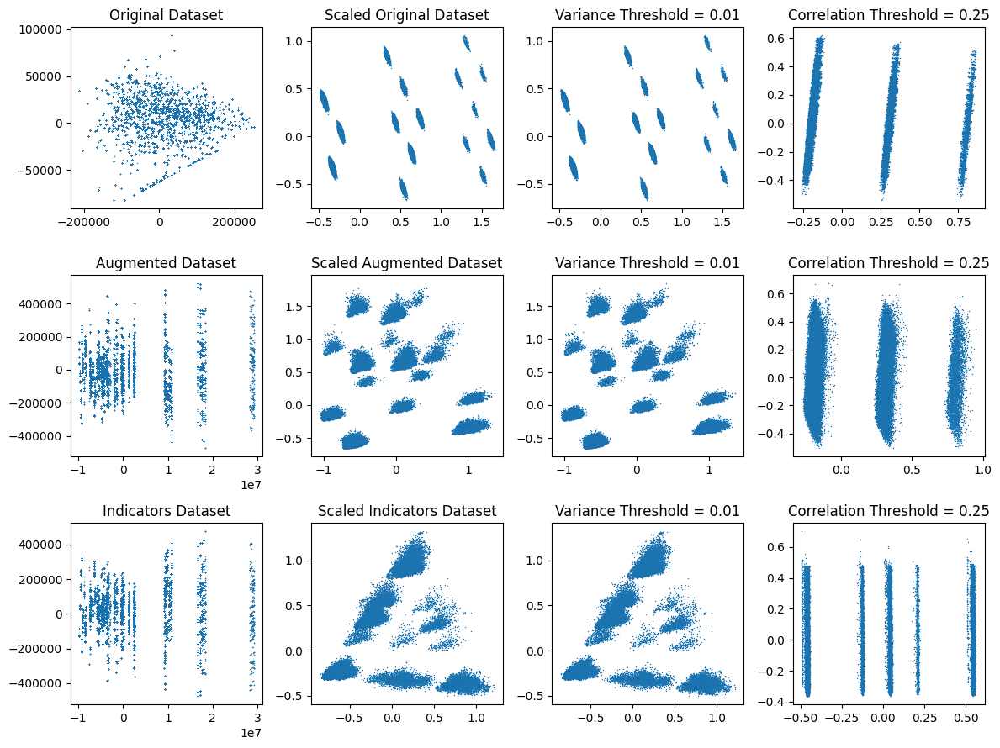

Original Dataset

Initial n_cols = 18

Survived columns (variance_threshold = 0.01):----------------------------------------------
n_cols = 14
Index(['latitude', 'longitude', 'min_age_participants', 'avg_age_participants',
       'max_age_participants', 'n_participants_adult', 'n_males', 'n_injured',
       'n_arrested', 'n_unharmed', 'n_participants', 'povertyPercentage',
       'candidatevotes', 'totalvotes'],
      dtype='object')

Survived columns (correlation_threshold = 0.25):----------------------------------------------
n_cols = 4
Index(['latitude', 'longitude', 'min_age_participants',
       'n_participants_adult'],
      dtype='object')

Augmented Dataset

Initial n_cols = 51

Survived columns (variance_threshold = 0.01):----------------------------------------------
n_cols = 37
Index(['latitude', 'longitude', 'min_age_participants', 'avg_age_participants',
       'max_age_participants', 'n_participants_adult', 'n_males', 'n_injured',
       'n_arrested', 'n_unharmed', 'n_par

In [5]:
OUTLIERS_REM = 'remove_outliers_iqr'
#OUTLIERS_REM = 'flag'
#SCALER = 'std'
SCALER = 'minmax'

df_init = pd.read_csv('./dataset/data/final_clean2.csv')

if OUTLIERS_REM == 'flag':
    df_init = df_init[df_init['OUTLIER'] == 0]
else:
    for col in orig_num_cols:
        df_init = remove_outliers_iqr(df_init, col)    

df_orig, df_orig_s, scaler_orig = prepare(df=df_init, scaler=SCALER, with_indicators=False, with_original=True)
df, df_s, scaler = prepare(df=df_init, scaler=SCALER, with_indicators=True, with_original=True)
df_ind, df_ind_s, scaler_ind = prepare(df=df_init, scaler=SCALER, with_indicators=True, with_original=False)

print(f'Dataset dimentions: {df_init.shape}')
print(f'Dataset dimentions without ouliers, with only numerical cols, without indicators: {df_orig.shape}')
print(f'Dataset dimentions without ouliers, with only numerical cols, with indicators: {df.shape}')
print(f'Dataset dimentions without ouliers, with only numerical cols, only indicators: {df_ind.shape}')

dataframes = [df_orig, df, df_ind]
scaled_dataframes = [df_orig_s, df_s, df_ind_s]
scalers = [scaler_orig, scaler, scaler_ind]
titles = ['Original Dataset', 'Augmented Dataset', 'Indicators Dataset']
N = len(dataframes)

if SCALER == 'minmax':
    var_thr = 0.01
    corr_thr = 0.25
else:
    var_thr = 1
    corr_thr = 0.25

reduced1s = []
reduced2s = []

for ds in scaled_dataframes:
    rs1 = features_reduction_var(ds, variance_threshold=var_thr)
    rs2 = features_reduction_corr(rs1, correlation_threshold=corr_thr)
    reduced1s.append(rs1)
    reduced2s.append(rs2)

plt.figure(figsize=(12, 9))

for d, ds, rs1, rs2, t, i in zip(dataframes, scaled_dataframes, reduced1s, reduced2s, titles, np.arange(1, N*4, 4)):

    pca = perform_PCA(df=d, n_components=2)
    pca_s = perform_PCA(df=ds, n_components=2)
    pca_rs1 = perform_PCA(df=rs1, n_components=2)
    pca_rs2 = perform_PCA(df=rs2, n_components=2)

    plt.subplot(3, 4, i)
    plt.scatter(pca[:, 0], pca[:, 1], s=1, edgecolors='black', linewidths=0.001)
    plt.title(t)

    plt.subplot(3, 4, i+1)
    plt.scatter(pca_s[:, 0], pca_s[:, 1], s=1, edgecolors='black', linewidths=0.001)
    plt.title(f'Scaled {t}')

    plt.subplot(3, 4, i+2)
    plt.scatter(pca_rs1[:, 0], pca_rs1[:, 1], s=1, edgecolors='black', linewidths=0.001)
    plt.title(f'Variance Threshold = {var_thr}')

    plt.subplot(3, 4, i+3)
    plt.scatter(pca_rs2[:, 0], pca_rs2[:, 1], s=1, edgecolors='black', linewidths=0.001)
    plt.title(f'Correlation Threshold = {corr_thr}')

plt.tight_layout()
plt.show()

for ds, rs1, rs2, t in zip(scaled_dataframes, reduced1s, reduced2s, titles):
    print(f'{t}\n\nInitial n_cols = {ds.shape[1]}')
    print(f'\nSurvived columns (variance_threshold = {var_thr}):----------------------------------------------')
    print(f'n_cols = {len(rs1.columns)}')
    print(rs1.columns)

    print(f'\nSurvived columns (correlation_threshold = {corr_thr}):----------------------------------------------')
    print(f'n_cols = {len(rs2.columns)}')
    print(f'{rs2.columns}\n')

scaled_dataframes = scaled_dataframes + reduced2s
dataframes = dataframes*2
scalers = scalers*2

# K-means

In [5]:
K_MIN = 2
K_MAX = 20
N = len(scaled_dataframes)
MODEL_NAMES = ['Original Model', 'Augmented Model', 'Indicators Model', 'Original Reduced Model', 'Augmented Reduced Model', 'Indicators Reduced Model']

modelss = []
for dataframe in scaled_dataframes:
    modelss.append(k_means(dataframe, k_min=K_MIN, k_max=K_MAX, max_iter=1000000))

100%|██████████| 19/19 [00:55<00:00,  2.90s/it]


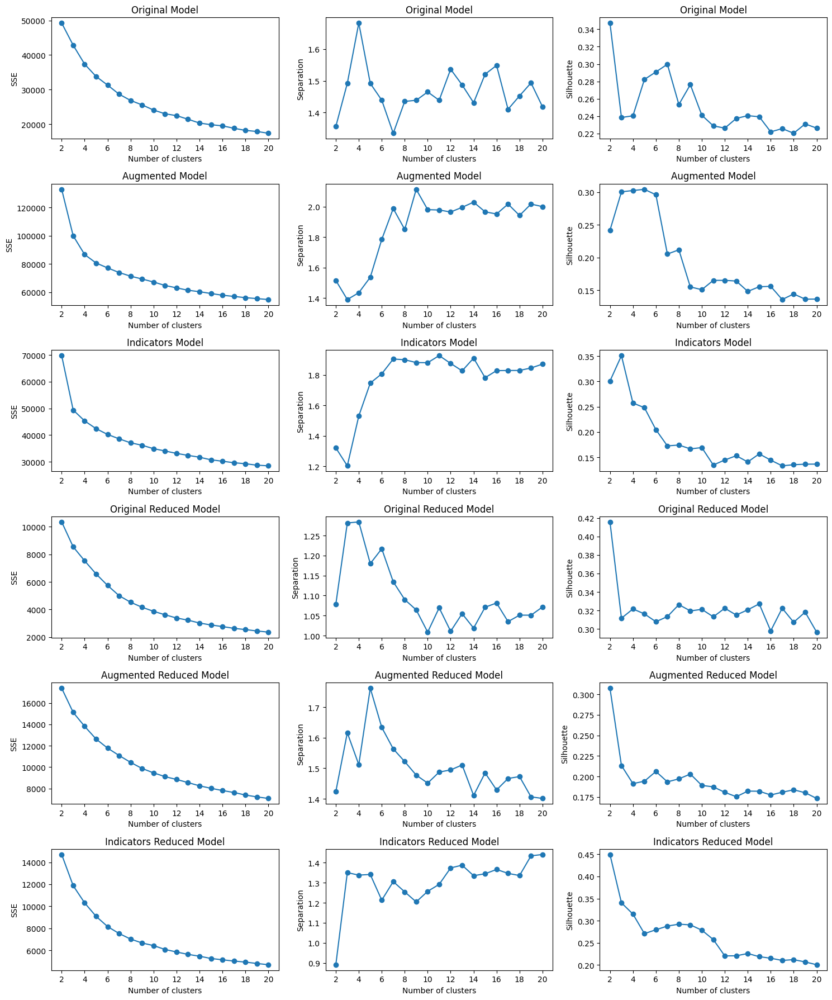

In [6]:
best_ks = []
model_scores = []

for models, model_name, dataframe in zip(modelss, MODEL_NAMES, scaled_dataframes):
    score_dict = scores(models=models, df=dataframe, model_name=model_name, k_min=K_MIN, k_max=K_MAX, sample_size=1000, n_samples=5)
    model_scores.append(score_dict)
    mean_sils = [np.mean(score_dict['Silhouette'][k]) for k in range(K_MIN, K_MAX+1)]
    best_ks.append(np.argmax(mean_sils)+K_MIN)
show_scores(model_scores=model_scores, model_names=MODEL_NAMES, k_mins=[K_MIN]*N, k_maxs=[K_MAX]*N)

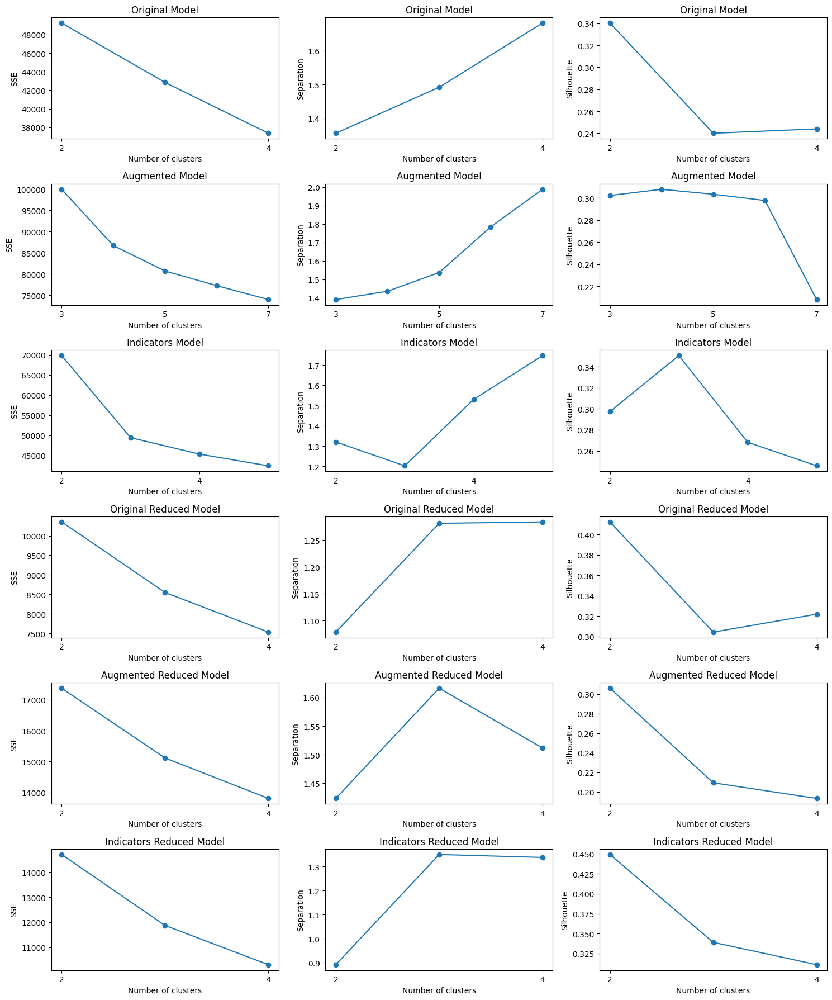

In [7]:
best_k2s = []
model_score2s = []
k_mins = []
k_maxs = []

for models, model_name, best_k, dataframe in zip(modelss, MODEL_NAMES, best_ks, scaled_dataframes):
    k_min = np.max([best_k-2, K_MIN])
    k_max = np.min([best_k+2, K_MAX])
    k_mins.append(k_min)
    k_maxs.append(k_max)
    score_dict = scores(models=models, df=dataframe, model_name=model_name, k_min=k_min, k_max=k_max, sample_size=5000, n_samples=3)
    model_score2s.append(score_dict)
    mean_sils = [np.mean(score_dict['Silhouette'][k]) for k in range(k_min, k_max+1)]
    best_k2s.append(np.argmax(mean_sils)+k_min)

show_scores(model_scores=model_score2s, model_names=MODEL_NAMES, k_mins=k_mins, k_maxs=k_maxs)

Original Model:
k = 2
SSE = 49250.53502530204
Separation = 1.3558916275942778
Silhouette = 0.34283209597199177

Augmented Model:
k = 4
SSE = 86692.84809651952
Separation = 1.4354361497135473
Silhouette = 0.3093572836557323

Indicators Model:
k = 3
SSE = 49387.97596077811
Separation = 1.2023426808579958
Silhouette = 0.3508121397450162

Original Reduced Model:
k = 2
SSE = 10355.21951231336
Separation = 1.0783601685176432
Silhouette = 0.4138093328103956

Augmented Reduced Model:
k = 2
SSE = 17374.90296477445
Separation = 1.4237179492940157
Silhouette = 0.3065266946289096

Indicators Reduced Model:
k = 2
SSE = 14700.648805264998
Separation = 0.8910195958883437
Silhouette = 0.44633346188130774



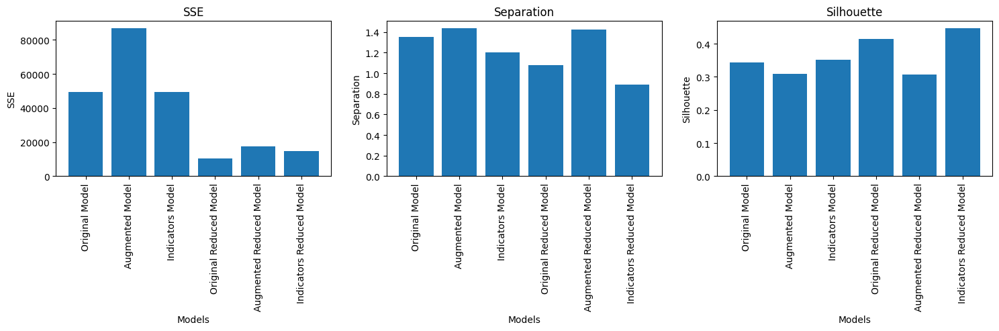

In [8]:
best_scores = []
best_models = []
file_names = ['orig', '', 'ind', 'orig_r', '_r', 'ind_r']
for models, model_name, best_k, dataframe, f in zip(modelss, MODEL_NAMES, best_k2s, scaled_dataframes, file_names):
    model_score = scores(models=models, model_name=model_name, df=dataframe, k_min=best_k, k_max=best_k, sample_size=10000, n_samples=3)

    best_scores.append({
        'SSE': model_score['SSE'][best_k],
        'Separation': model_score['Separation'][best_k],
        'Silhouette': np.mean(model_score['Silhouette'][best_k])
    })
    best_models.append(models[best_k])

    if SCALER == 'minmax':
        joblib.dump(models[best_k], f'models/best_kmeans_{f}_mms.pkl')
        for i in range(len(models)):
            joblib.dump(models[i], f'models/kmeans{i}_{f}_mms.pkl')
    else:
        joblib.dump(models[best_k], f'models/best_kmeans_{f}_ss.pkl')
        for i in range(len(models)):
            joblib.dump(models[i], f'models/kmeans{i}_{f}_ss.pkl')

for k, s, model_name in zip(best_k2s, best_scores, MODEL_NAMES):
    print(f'{model_name}:\nk = {k}')
    for key in s:
        print(f'{key} = {np.mean(s[key])}')
    print('')

plt.figure(figsize=(18, 3))
for key, i in zip(best_scores[0].keys(), range(len(best_scores[0].keys()))):
    values = [s[key] for s in best_scores]
    plt.subplot(1, 3, i+1)
    plt.bar(MODEL_NAMES, values)
    plt.xticks(rotation=90)
    plt.xlabel('Models')
    plt.ylabel(key)
    plt.title(key)
plt.show()

Original Model (k = 2):


100%|██████████| 5/5 [00:13<00:00,  2.67s/it]


Augmented Model (k = 4):


100%|██████████| 5/5 [00:14<00:00,  2.89s/it]


Indicators Model (k = 3):


100%|██████████| 5/5 [00:12<00:00,  2.56s/it]


Original Reduced Model (k = 2):


100%|██████████| 5/5 [00:15<00:00,  3.06s/it]


Augmented Reduced Model (k = 2):


100%|██████████| 5/5 [00:14<00:00,  2.99s/it]


Indicators Reduced Model (k = 2):


100%|██████████| 5/5 [00:16<00:00,  3.29s/it]


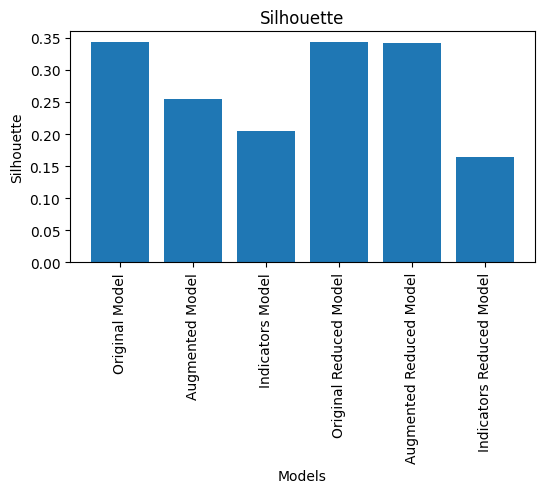

Silhouette scores (avg) on the original dataset:
Original Model (k = 2): 0.34291252039774545
Augmented Model (k = 4): 0.25459809201912076
Indicators Model (k = 3): 0.20434741755174884
Original Reduced Model (k = 2): 0.3428783445643003
Augmented Reduced Model (k = 2): 0.342414331718908
Indicators Reduced Model (k = 2): 0.16364513594609104


In [9]:
n_samples = 5
sample_size = 5000
silhouettess = []
for model, model_name in zip(best_models, MODEL_NAMES):
    silhouettes = []
    print(f'{model_name} (k = {len(model.cluster_centers_)}):')     
    for j in tqdm(range(0, n_samples)):   
        sampled_indeces = random.sample(range(df_orig_s.shape[0]), sample_size)
        sampled_points = [df_orig_s.iloc[i] for i in sampled_indeces]
        sampled_labels = [model.labels_[i] for i in sampled_indeces]
        silhouettes.append(silhouette_score(sampled_points, sampled_labels))
    #clear_output(wait=True)
    silhouettess.append(silhouettes)

plt.figure(figsize=(6, 3))
plt.plot()
values = [np.mean(silhouettes) for silhouettes in silhouettess]
plt.bar(MODEL_NAMES, values)
plt.xticks(rotation=90)
plt.xlabel('Models')
plt.ylabel('Silhouette')
plt.title('Silhouette')
plt.show()

print('Silhouette scores (avg) on the original dataset:')
for model, model_name, val in zip(best_models, MODEL_NAMES, values):
    print(f'{model_name} (k = {len(model.cluster_centers_)}): {val}')

/home/claudia/code/DataMining/DataMining-2023/.env/lib/python3.10/site-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
/home/claudia/code/DataMining/DataMining-2023/.env/lib/python3.10/site-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
/home/claudia/code/DataMining/DataMining-2023/.env/lib/python3.10/site-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
/home/claudia/code/DataMining/DataMining-2023/.env/lib/python3.10/site-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
/home/claudia/code/DataMining/DataMining-2023/.env/lib/python3.10/site-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but PCA was fitted with f

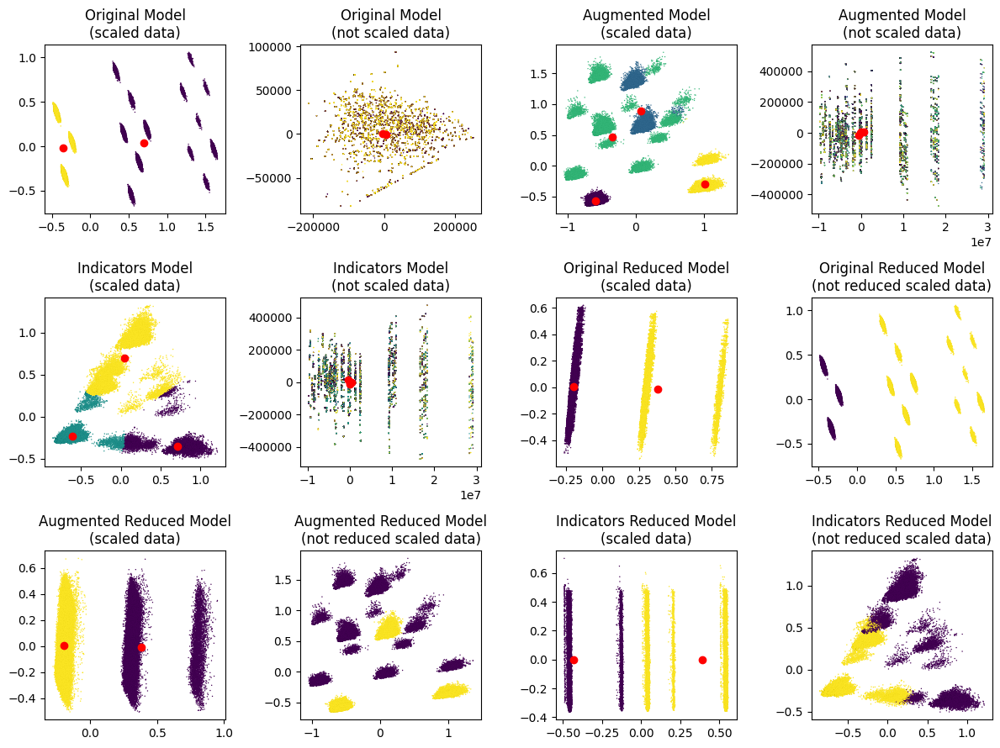

Original Model:
Cluster 0: 32229 points
Cluster 1: 62962 points

Augmented Model:
Cluster 0: 30746 points
Cluster 1: 15337 points
Cluster 2: 24162 points
Cluster 3: 24946 points

Indicators Model:
Cluster 0: 30059 points
Cluster 1: 37561 points
Cluster 2: 27571 points

Original Reduced Model:
Cluster 0: 62962 points
Cluster 1: 32229 points

Augmented Reduced Model:
Cluster 0: 32229 points
Cluster 1: 62962 points

Indicators Reduced Model:
Cluster 0: 45170 points
Cluster 1: 50021 points



In [10]:
plt.figure(figsize=(12, 9))

for i, j in zip(range(len(best_models)), np.arange(1, len(best_models)*2, 2)):
    model = best_models[i]
    model_name = MODEL_NAMES[i]
    dataframe = dataframes[i]
    scaled_dataframe = scaled_dataframes[i]
    scaler = scalers[i]
    labels = model.labels_
    centroids = model.cluster_centers_
    points_pca_s, centroids_pca_s = perform_PCA(df=scaled_dataframe, centroids=centroids, n_components=2)

    plt.subplot(3, 4, j)
    plt.scatter(points_pca_s[:, 0], points_pca_s[:, 1], c=labels, s=1, edgecolors='black', linewidths=0.001)
    plt.scatter(centroids_pca_s[:, 0], centroids_pca_s[:, 1], c='red', marker='o')
    plt.title(f'{model_name}\n(scaled data)')

    plt.subplot(3, 4, j+1)
    if 'Reduced' in model_name:
        points_pca = perform_PCA(df=scaled_dataframes[i-3], n_components=2)
        plt.scatter(points_pca[:, 0], points_pca[:, 1], c=labels, s=1, edgecolors='black', linewidths=0.001)
        plt.title(f'{model_name}\n(not reduced scaled data)')

    else:
        points_pca, centroids_pca = perform_PCA(df=dataframe, centroids=scaler.inverse_transform(centroids), n_components=2)
        plt.scatter(points_pca[:, 0], points_pca[:, 1], c=labels, s=1, edgecolors='black', linewidths=0.001)
        plt.scatter(centroids_pca[:, 0], centroids_pca[:, 1], c='red', marker='o')
        plt.title(f'{model_name}\n(not scaled data)')

plt.tight_layout()
plt.show()

for model, model_name in zip(best_models, MODEL_NAMES):
    print(f'{model_name}:')
    cluster_labels, cluster_counts = np.unique(model.labels_, return_counts=True)
    for l, c in zip(cluster_labels, cluster_counts):
        print(f'Cluster {l}: {c} points')
    print('')

## Feature reduction based on centroids

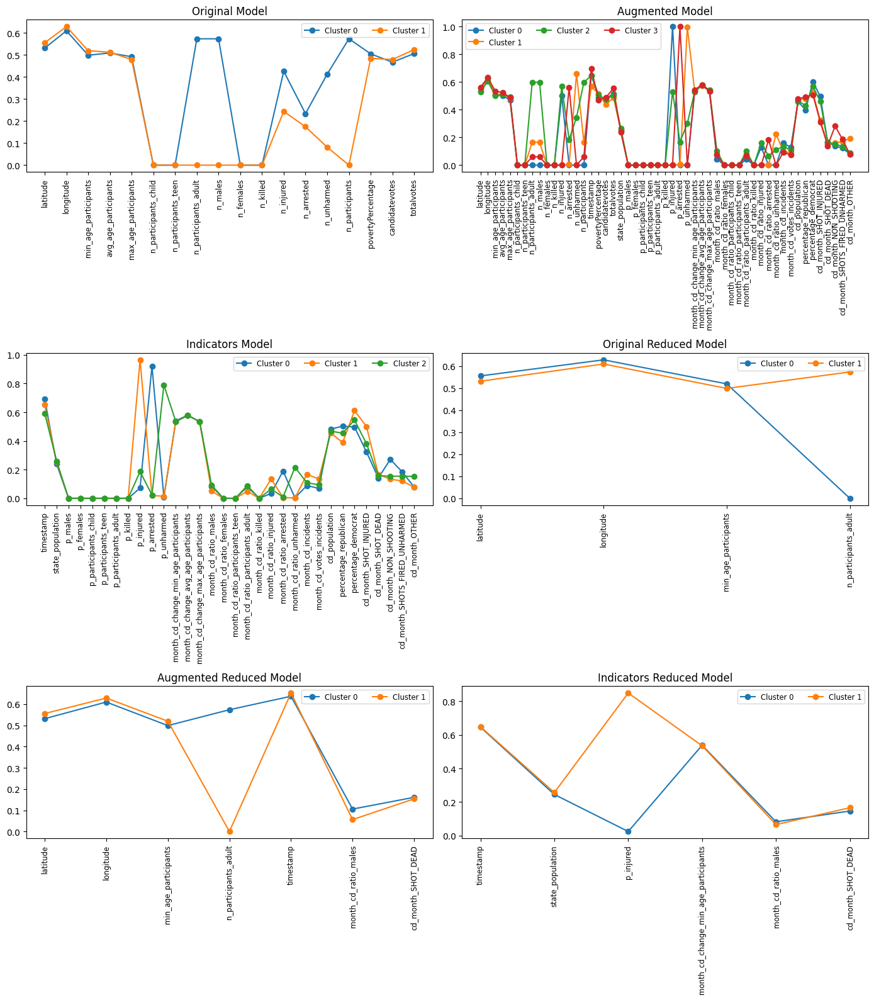

In [11]:
plt.figure(figsize=(14, 16))
for i in range(len(best_models)):
    centers = best_models[i].cluster_centers_
    cols = scaled_dataframes[i].columns
    model_name = MODEL_NAMES[i]
    plt.subplot(3, 2, i+1)
    plt.title(model_name)
    for j in range(len(centers)):
        plt.plot(centers[j], marker='o', label=f'Cluster {j}')
        plt.xticks(range(len(cols)), cols, rotation=90, fontsize='small')
        plt.legend(fontsize='small', ncol=3)
plt.tight_layout()
plt.show()

In [31]:
new_colss = []
for model, model_name, dataframe in zip(best_models, MODEL_NAMES, scaled_dataframes):
    centers = model.cluster_centers_
    cols = dataframe.columns
    survived_cols = []
    for i in range(len(cols)):
        std_dev = np.std([center[i] for center in centers])
        if std_dev > 0.01:#0.05:
            survived_cols.append(cols[i])
    print(f'{model_name} -> cutted {len(cols)-len(survived_cols)} columns')
    new_colss.append(survived_cols)
print('')    
for cols in new_colss:
    print(cols)

Original Model -> cutted 9 columns
Augmented Model -> cutted 21 columns
Indicators Model -> cutted 13 columns
Original Reduced Model -> cutted 1 columns
Augmented Reduced Model -> cutted 3 columns
Indicators Reduced Model -> cutted 5 columns

['latitude', 'min_age_participants', 'n_participants_adult', 'n_males', 'n_injured', 'n_arrested', 'n_unharmed', 'n_participants', 'povertyPercentage']
['latitude', 'longitude', 'min_age_participants', 'n_participants_adult', 'n_males', 'n_injured', 'n_arrested', 'n_unharmed', 'n_participants', 'timestamp', 'povertyPercentage', 'candidatevotes', 'totalvotes', 'p_injured', 'p_arrested', 'p_unharmed', 'month_cd_ratio_males', 'month_cd_ratio_participants_adult', 'month_cd_ratio_injured', 'month_cd_ratio_arrested', 'month_cd_ratio_unharmed', 'month_cd_incidents', 'month_cd_votes_incidents', 'percentage_republican', 'percentage_democrat', 'cd_month_SHOT_INJURED', 'cd_month_SHOT_DEAD', 'cd_month_NON_SHOOTING', 'cd_month_SHOTS_FIRED_UNHARMED', 'cd_month_

In [16]:
'''new_colss = [['n_participants_adult', 'n_males', 'n_injured', 'n_unharmed', 'n_participants'],
['n_participants_adult', 'n_males', 'n_injured', 'n_arrested', 'n_unharmed', 'n_participants', 'p_injured', 'p_arrested', 'p_unharmed', 'month_cd_ratio_injured', 'month_cd_ratio_arrested', 'month_cd_ratio_unharmed', 'cd_month_SHOT_INJURED', 'cd_month_NON_SHOOTING'],
['p_injured', 'p_arrested', 'p_unharmed', 'month_cd_ratio_arrested', 'month_cd_ratio_unharmed', 'cd_month_SHOT_INJURED', 'cd_month_NON_SHOOTING'],
['n_participants_adult'],
['n_participants_adult'],
['p_injured']]
K_MIN = 2
K_MAX = 20
file_names = ['orig', '', 'ind', 'orig_r', '_r', 'ind_r']
best_models = []
for f in file_names:
    best_models.append(joblib.load(f'kmeans_{f}_mms.pkl'))
MODEL_NAMES = ['Original Model', 'Augmented Model', 'Indicators Model', 'Original Reduced Model', 'Augmented Reduced Model', 'Indicators Reduced Model']
for ds in scaled_dataframes:
    rs1 = features_reduction_var(ds, variance_threshold=var_thr)
    rs2 = features_reduction_corr(rs1, correlation_threshold=corr_thr)
    reduced1s.append(rs1)
    reduced2s.append(rs2)
scaled_dataframes = scaled_dataframes + reduced2s'''



In [13]:
model2ss = []
for dataframe, cols in zip(scaled_dataframes, new_colss):
    model2ss.append(k_means(dataframe[cols], k_min=K_MIN, k_max=K_MAX, max_iter=1000000))

 21%|██        | 4/19 [00:04<00:16,  1.13s/it]/home/claudia/code/DataMining/DataMining-2023/.env/lib/python3.10/site-packages/sklearn/base.py:1152: ConvergenceWarning: Number of distinct clusters (5) found smaller than n_clusters (6). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)
 26%|██▋       | 5/19 [00:05<00:15,  1.11s/it]/home/claudia/code/DataMining/DataMining-2023/.env/lib/python3.10/site-packages/sklearn/base.py:1152: ConvergenceWarning: Number of distinct clusters (5) found smaller than n_clusters (7). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)
 32%|███▏      | 6/19 [00:07<00:16,  1.29s/it]/home/claudia/code/DataMining/DataMining-2023/.env/lib/python3.10/site-packages/sklearn/base.py:1152: ConvergenceWarning: Number of distinct clusters (5) found smaller than n_clusters (8). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)
 37%|███▋      | 7/19 [00:08<00:16

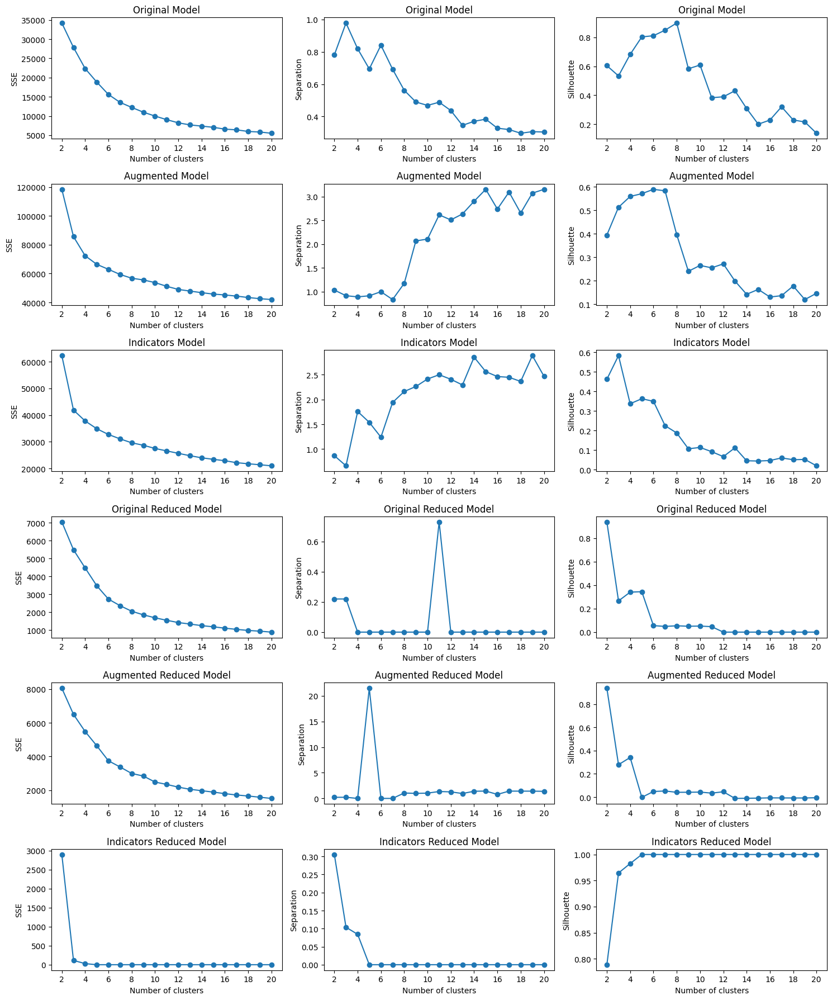

In [24]:
best_ks = []
model_scores = []

for models, model_name, dataframe, cols in zip(model2ss, MODEL_NAMES, scaled_dataframes[0:6], new_colss):
    score_dict = scores(models=models, df=dataframe[cols], model_name=model_name, k_min=K_MIN, k_max=K_MAX, sample_size=1000, n_samples=5)
    model_scores.append(score_dict)
    mean_sils = [np.mean(score_dict['Silhouette'][k]) for k in range(K_MIN, K_MAX+1)]
    best_ks.append(np.argmax(mean_sils)+K_MIN)
show_scores(model_scores=model_scores, model_names=MODEL_NAMES, k_mins=[K_MIN]*N, k_maxs=[K_MAX]*N)

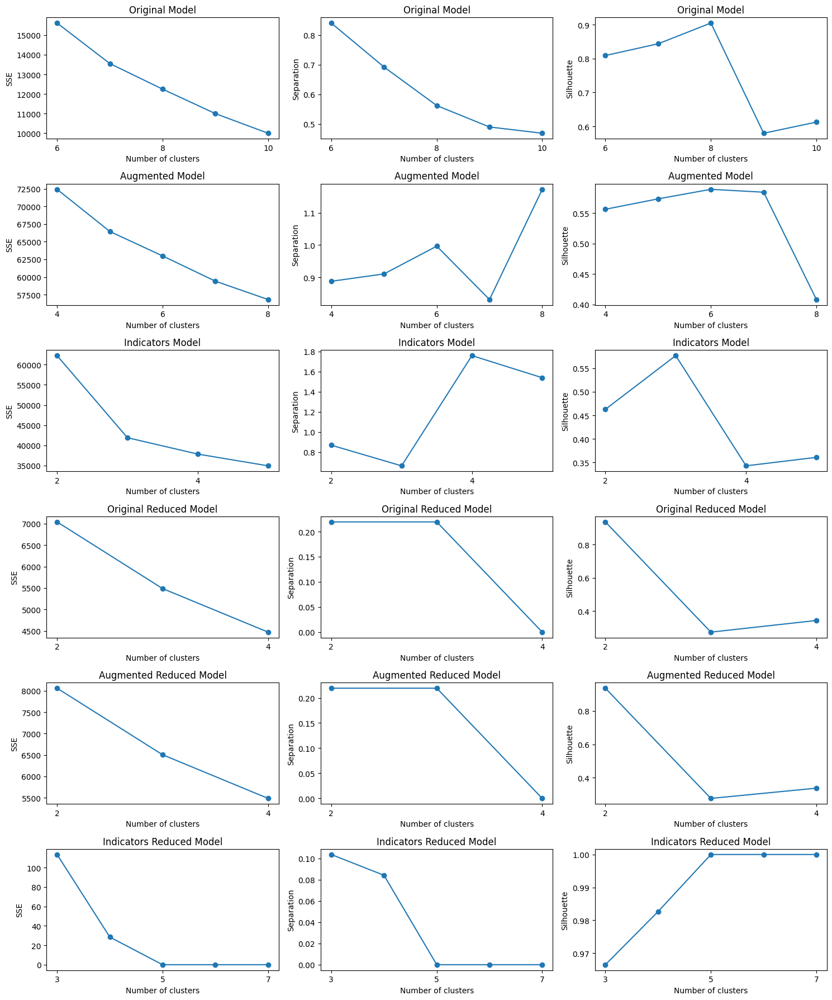

In [25]:
best_k2s = []
model_score2s = []
k_mins = []
k_maxs = []

for models, model_name, best_k, dataframe, cols in zip(model2ss, MODEL_NAMES, best_ks, scaled_dataframes, new_colss):
    k_min = np.max([best_k-2, K_MIN])
    k_max = np.min([best_k+2, K_MAX])
    k_mins.append(k_min)
    k_maxs.append(k_max)
    score_dict = scores(models=models, df=dataframe[cols], model_name=model_name, k_min=k_min, k_max=k_max, sample_size=5000, n_samples=3)
    model_score2s.append(score_dict)
    mean_sils = [np.mean(score_dict['Silhouette'][k]) for k in range(k_min, k_max+1)]
    best_k2s.append(np.argmax(mean_sils)+k_min)

show_scores(model_scores=model_score2s, model_names=MODEL_NAMES, k_mins=k_mins, k_maxs=k_maxs)

Original Model:
k = 8
SSE = 12248.299250076045
Separation = 0.5619916271134847
Silhouette = 0.9045629638159319

Augmented Model:
k = 6
SSE = 62979.40208274386
Separation = 0.9965058702243098
Silhouette = 0.5948400889208295

Indicators Model:
k = 3
SSE = 41869.03514809262
Separation = 0.664227323864847
Silhouette = 0.5736234422857257

Original Reduced Model:
k = 2
SSE = 7041.130068475341
Separation = 0.21929713834789835
Silhouette = 0.9375497815674771

Augmented Reduced Model:
k = 2
SSE = 8059.3222189281305
Separation = 0.21929713834789835
Silhouette = 0.9353593428123735

Indicators Reduced Model:
k = 5
SSE = 2.72612800703661e-22
Separation = 0.0
Silhouette = 1.0



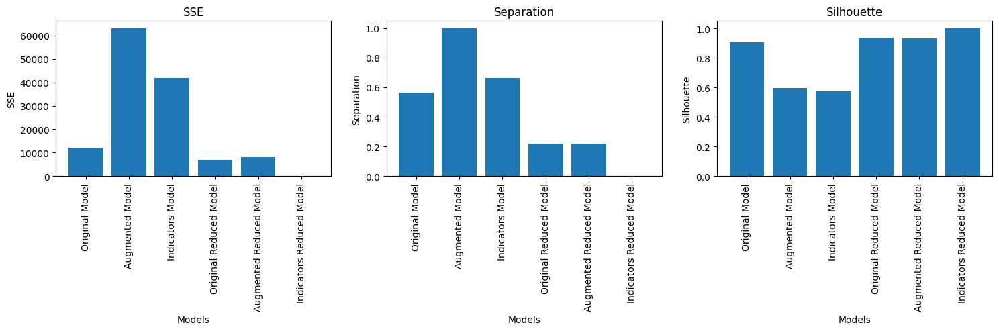

In [26]:
best_scores = []
best_model2s = []
file_names = ['orig', '', 'ind', 'orig_r', '_r', 'ind_r']
for models, model_name, best_k, dataframe, cols, f in zip(model2ss, MODEL_NAMES, best_k2s, scaled_dataframes, new_colss, file_names):
    model_score = scores(models=models, model_name=model_name, df=dataframe[cols], k_min=best_k, k_max=best_k, sample_size=10000, n_samples=3)

    best_scores.append({
        'SSE': model_score['SSE'][best_k],
        'Separation': model_score['Separation'][best_k],
        'Silhouette': np.mean(model_score['Silhouette'][best_k])
    })
    best_model2s.append(models[best_k])
    
    if SCALER == 'minmax':
        joblib.dump(models[best_k], f'models/best_kmeans_{f}2_mms.pkl')
        for i in range(len(models)):
            joblib.dump(models[i], f'models/kmeans{i}_{f}2_mms.pkl')
    else:
        joblib.dump(models[best_k], f'models/best_kmeans_{f}2_ss.pkl')
        for i in range(len(models)):
            joblib.dump(models[i], f'models/kmeans{i}2_{f}_ss.pkl')

for k, s, model_name in zip(best_k2s, best_scores, MODEL_NAMES):
    print(f'{model_name}:\nk = {k}')
    for key in s:
        print(f'{key} = {np.mean(s[key])}')
    print('')

plt.figure(figsize=(18, 3))
for key, i in zip(best_scores[0].keys(), range(len(best_scores[0].keys()))):
    values = [s[key] for s in best_scores]
    plt.subplot(1, 3, i+1)
    plt.bar(MODEL_NAMES, values)
    plt.xticks(rotation=90)
    plt.xlabel('Models')
    plt.ylabel(key)
    plt.title(key)
plt.show()

Original Model (k = 8):


100%|██████████| 5/5 [00:13<00:00,  2.62s/it]


Augmented Model (k = 6):


100%|██████████| 5/5 [00:13<00:00,  2.77s/it]


Indicators Model (k = 3):


100%|██████████| 5/5 [00:11<00:00,  2.38s/it]


Original Reduced Model (k = 2):


100%|██████████| 5/5 [00:12<00:00,  2.45s/it]


Augmented Reduced Model (k = 2):


100%|██████████| 5/5 [00:13<00:00,  2.71s/it]


Indicators Reduced Model (k = 5):


100%|██████████| 5/5 [00:15<00:00,  3.08s/it]


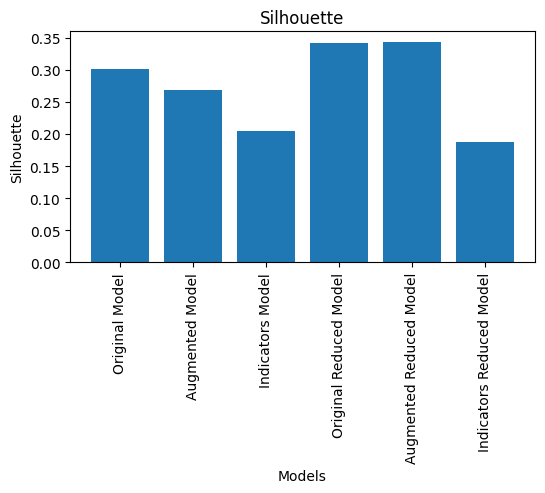

Silhouette scores (avg) on the original dataset:
Original Model 2 (k = 8): 0.3006040195270489
Augmented Model 2 (k = 6): 0.2686241833020513
Indicators Model 2 (k = 3): 0.20399568855114558
Original Reduced Model 2 (k = 2): 0.34173088670143725
Augmented Reduced Model 2 (k = 2): 0.34265824463887684
Indicators Reduced Model 2 (k = 5): 0.18772884619790225


In [27]:
n_samples = 5
sample_size = 5000
silhouettess = []
for model, model_name in zip(best_model2s, MODEL_NAMES):
    silhouettes = []
    print(f'{model_name} (k = {len(model.cluster_centers_)}):')     
    for j in tqdm(range(0, n_samples)):   
        sampled_indeces = random.sample(range(df_orig_s.shape[0]), sample_size)
        sampled_points = [df_orig_s.iloc[i] for i in sampled_indeces]
        sampled_labels = [model.labels_[i] for i in sampled_indeces]
        silhouettes.append(silhouette_score(sampled_points, sampled_labels))
    #clear_output(wait=True)
    silhouettess.append(silhouettes)

plt.figure(figsize=(6, 3))
plt.plot()
values = [np.mean(silhouettes) for silhouettes in silhouettess]
plt.bar(MODEL_NAMES, values)
plt.xticks(rotation=90)
plt.xlabel('Models')
plt.ylabel('Silhouette')
plt.title('Silhouette')
plt.show()

print('Silhouette scores (avg) on the original dataset:')
for model, model_name, val in zip(best_model2s, MODEL_NAMES, values):
    print(f'{model_name} 2 (k = {len(model.cluster_centers_)}): {val}')

/home/claudia/code/DataMining/DataMining-2023/.env/lib/python3.10/site-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
/home/claudia/code/DataMining/DataMining-2023/.env/lib/python3.10/site-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
/home/claudia/code/DataMining/DataMining-2023/.env/lib/python3.10/site-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
/home/claudia/code/DataMining/DataMining-2023/.env/lib/python3.10/site-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(
/home/claudia/code/DataMining/DataMining-2023/.env/lib/python3.10/site-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but PCA was fitted with f

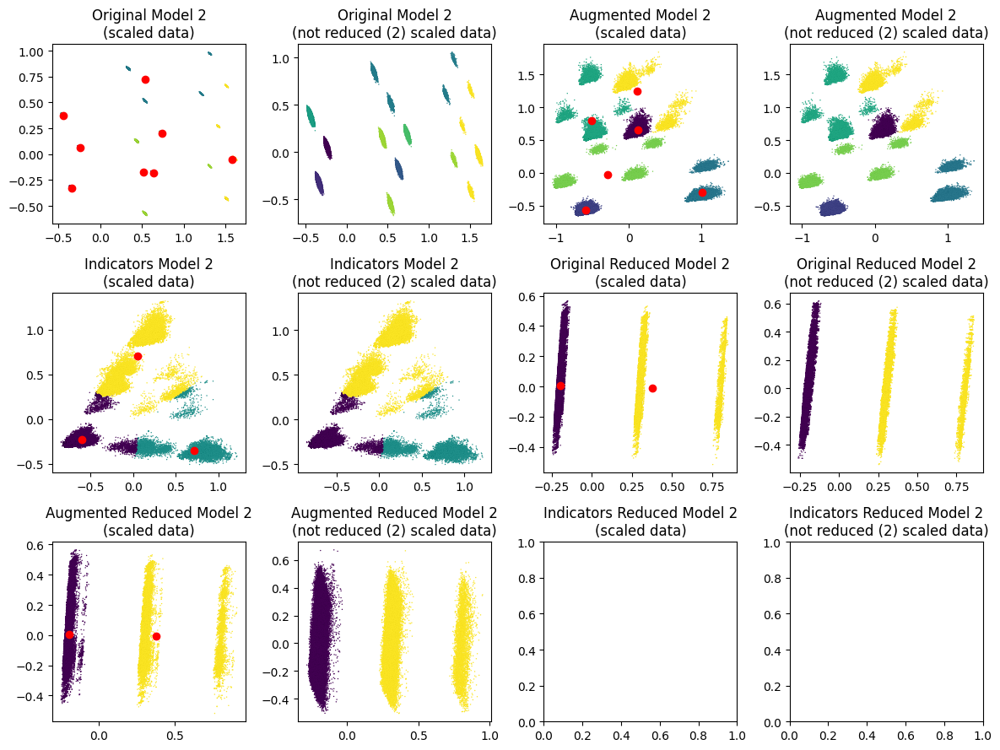

Original Model:
Cluster 0: 10276 points
Cluster 1: 30746 points
Cluster 2: 9170 points
Cluster 3: 5235 points
Cluster 4: 21940 points
Cluster 5: 4931 points
Cluster 6: 9432 points
Cluster 7: 3461 points

Augmented Model:
Cluster 0: 10276 points
Cluster 1: 30746 points
Cluster 2: 24943 points
Cluster 3: 12411 points
Cluster 4: 10092 points
Cluster 5: 6723 points

Indicators Model:
Cluster 0: 37626 points
Cluster 1: 30059 points
Cluster 2: 27506 points

Original Reduced Model:
Cluster 0: 62962 points
Cluster 1: 32229 points

Augmented Reduced Model:
Cluster 0: 62962 points
Cluster 1: 32229 points

Indicators Reduced Model:
Cluster 0: 34622 points
Cluster 1: 41942 points
Cluster 2: 14296 points
Cluster 3: 3228 points
Cluster 4: 1103 points



In [43]:
plt.figure(figsize=(12, 9))

for i, j in zip(range(len(best_model2s)), np.arange(1, len(best_model2s)*2, 2)):
    model = best_model2s[i]
    model_name = MODEL_NAMES[i]
    cols = new_colss[i]
    dataframe = scaled_dataframes[i]
    scaled_dataframe = scaled_dataframes[i][cols]
    scaler = scalers[i]
    labels = model.labels_
    centroids = model.cluster_centers_
    if len(cols) > 1:
        points_pca_s, centroids_pca_s = perform_PCA(df=scaled_dataframe, centroids=centroids, n_components=2)

        plt.subplot(3, 4, j)
        plt.scatter(points_pca_s[:, 0], points_pca_s[:, 1], c=labels, s=1, edgecolors='black', linewidths=0.001)
        plt.scatter(centroids_pca_s[:, 0], centroids_pca_s[:, 1], c='red', marker='o')
        plt.title(f'{model_name} 2\n(scaled data)')

        plt.subplot(3, 4, j+1)
        points_pca = perform_PCA(df=dataframe, n_components=2)
        plt.scatter(points_pca[:, 0], points_pca[:, 1], c=labels, s=1, edgecolors='black', linewidths=0.001)
        plt.title(f'{model_name} 2\n(not reduced (2) scaled data)')
    else:
        plt.subplot(3, 4, j)
        plt.title(f'{model_name} 2\n(scaled data)')

        plt.subplot(3, 4, j+1)
        plt.title(f'{model_name} 2\n(not reduced (2) scaled data)')

plt.tight_layout()
plt.show()

for model, model_name in zip(best_model2s, MODEL_NAMES):
    print(f'{model_name}:')
    cluster_labels, cluster_counts = np.unique(model.labels_, return_counts=True)
    for l, c in zip(cluster_labels, cluster_counts):
        print(f'Cluster {l}: {c} points')
    print('')

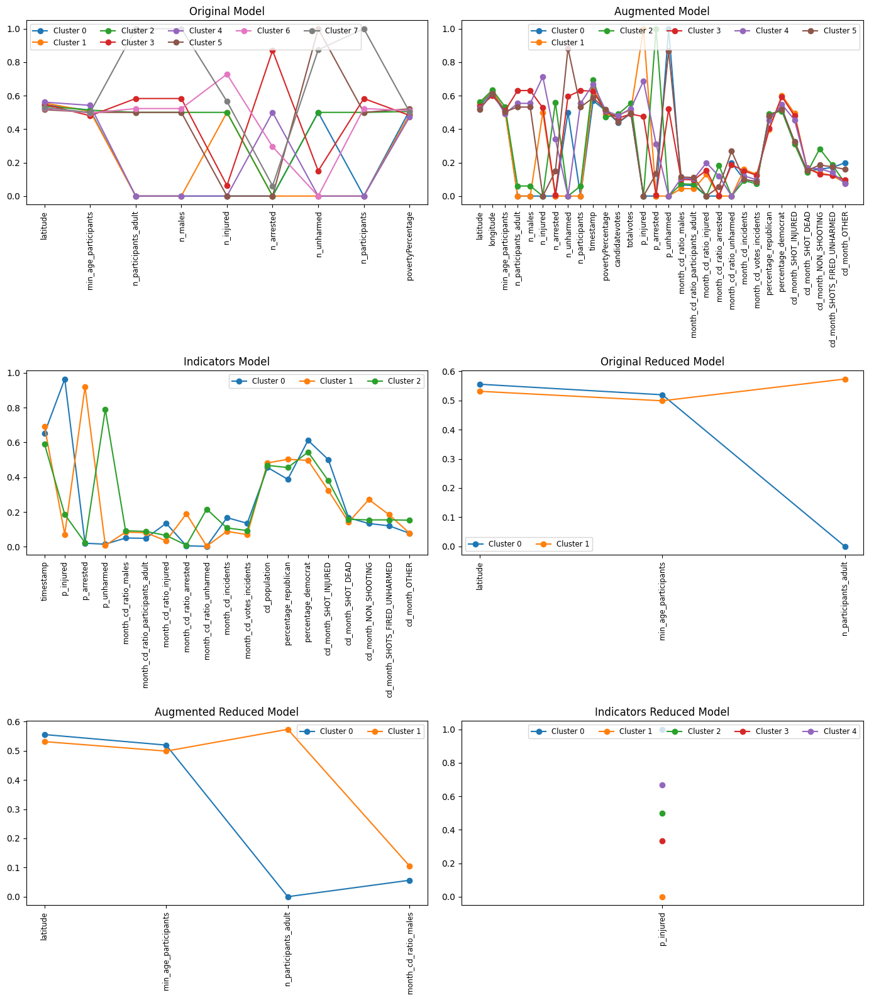

In [44]:
plt.figure(figsize=(14, 16))
for i in range(len(best_model2s)):
    centers = best_model2s[i].cluster_centers_
    cols = new_colss[i]
    model_name = MODEL_NAMES[i]
    plt.subplot(3, 2, i+1)
    plt.title(model_name)
    for j in range(len(centers)):
        plt.plot(centers[j], marker='o', label=f'Cluster {j}')
        plt.xticks(range(len(cols)), cols, rotation=90, fontsize='small')
        plt.legend(fontsize='small', ncol=5)
plt.tight_layout()
plt.show()

## Analysis

#### Original data clustering

Original Model


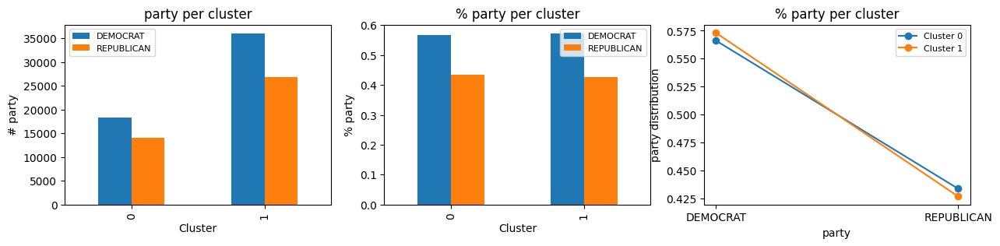

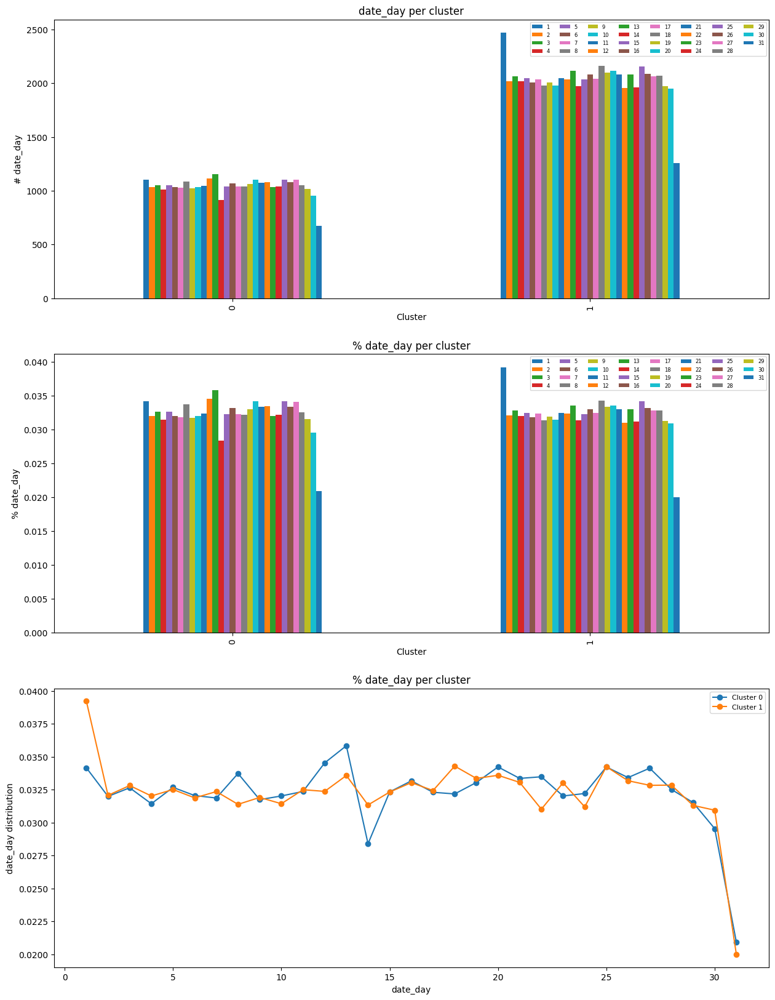

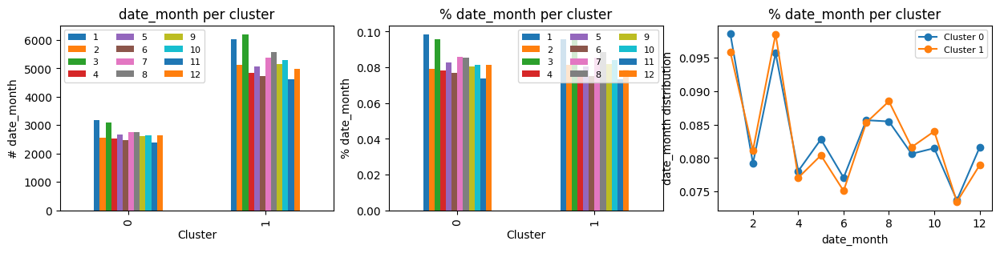

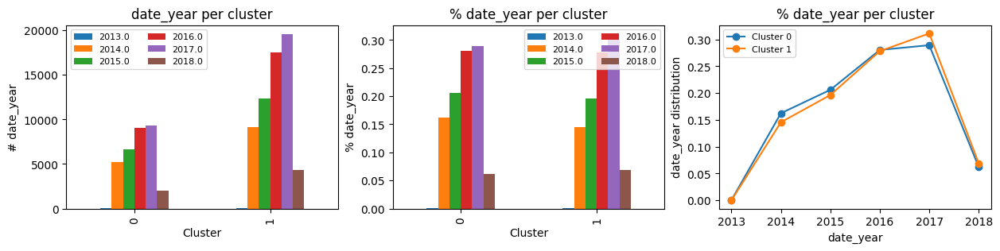

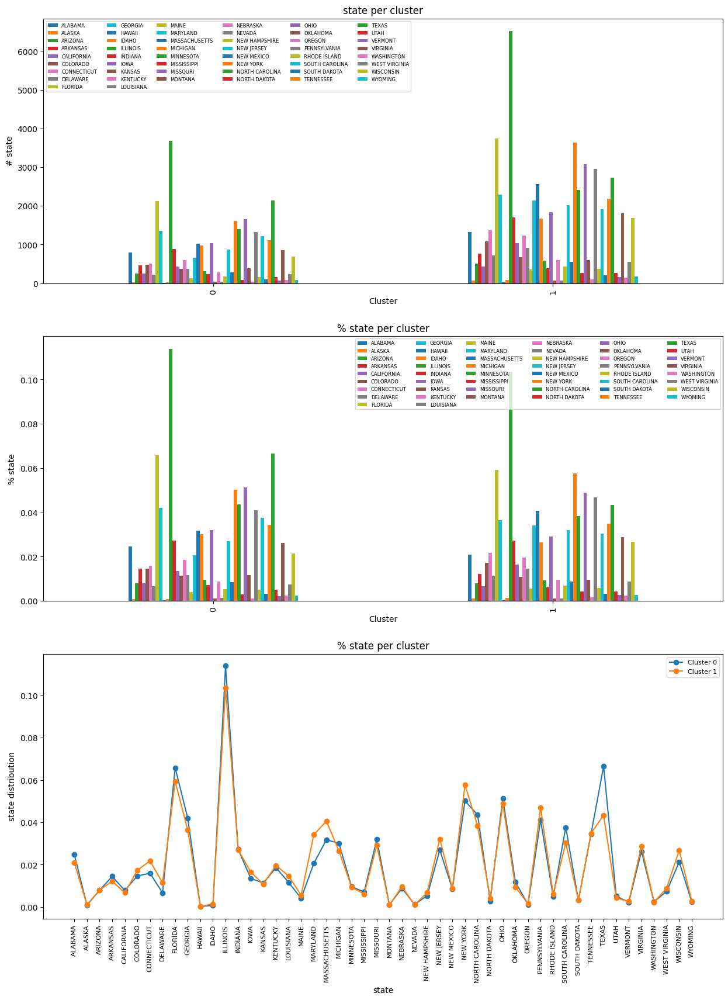

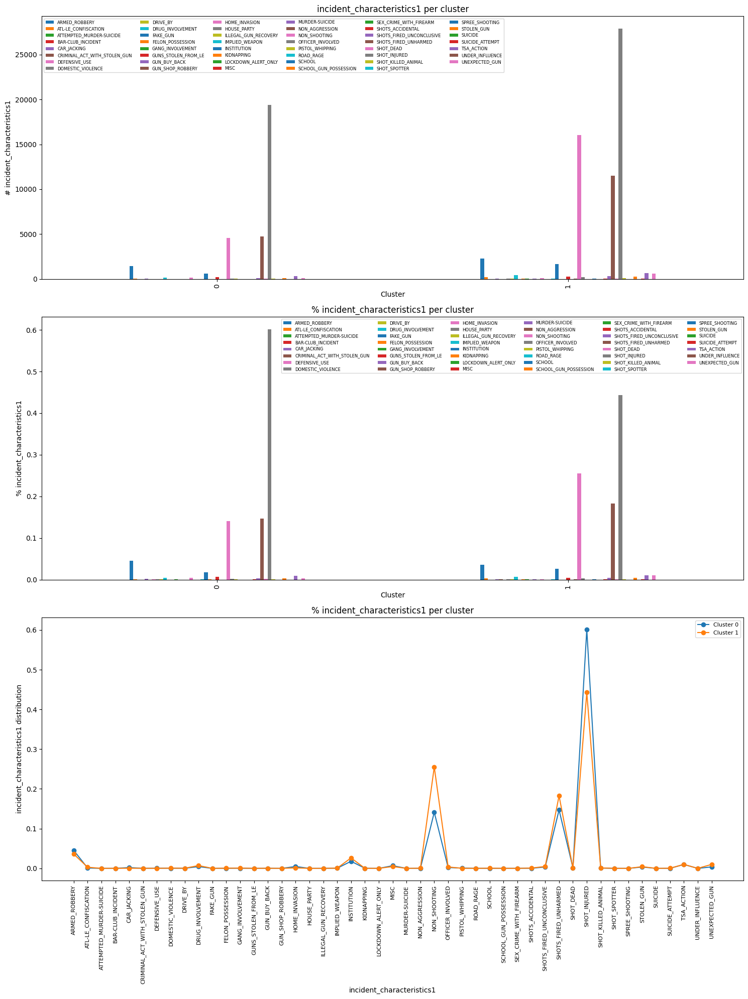

Augmented Model


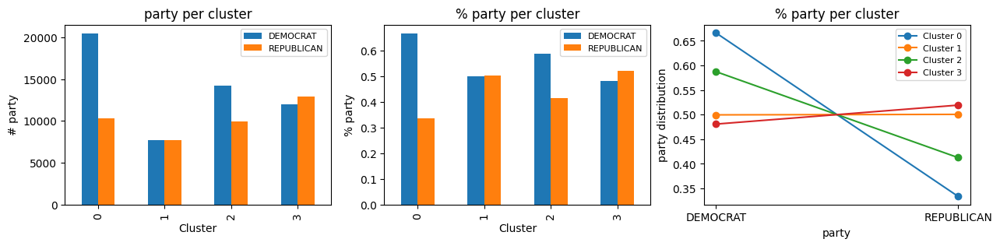

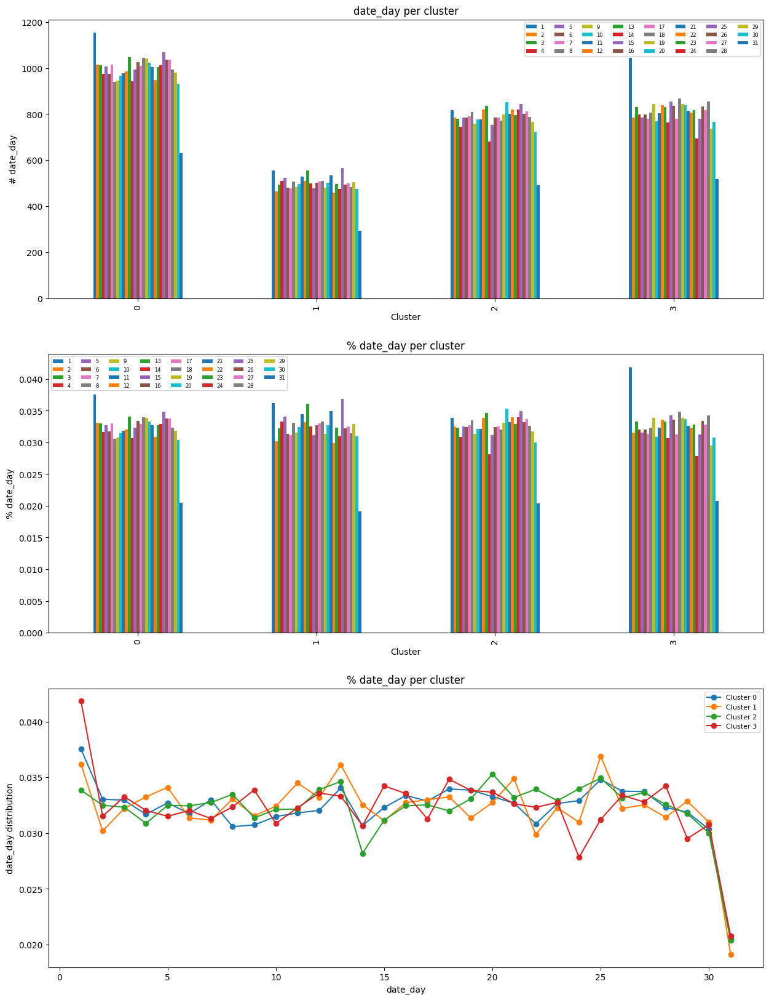

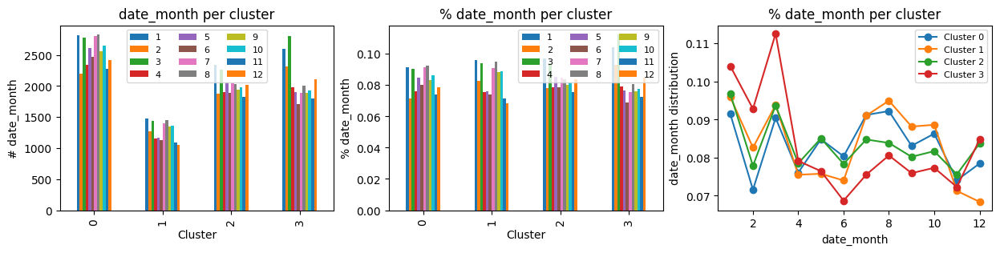

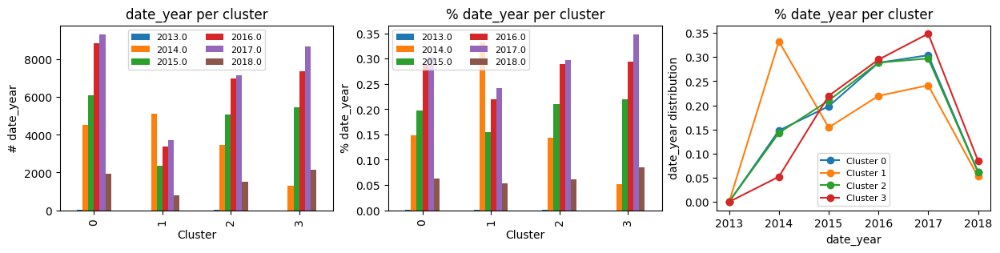

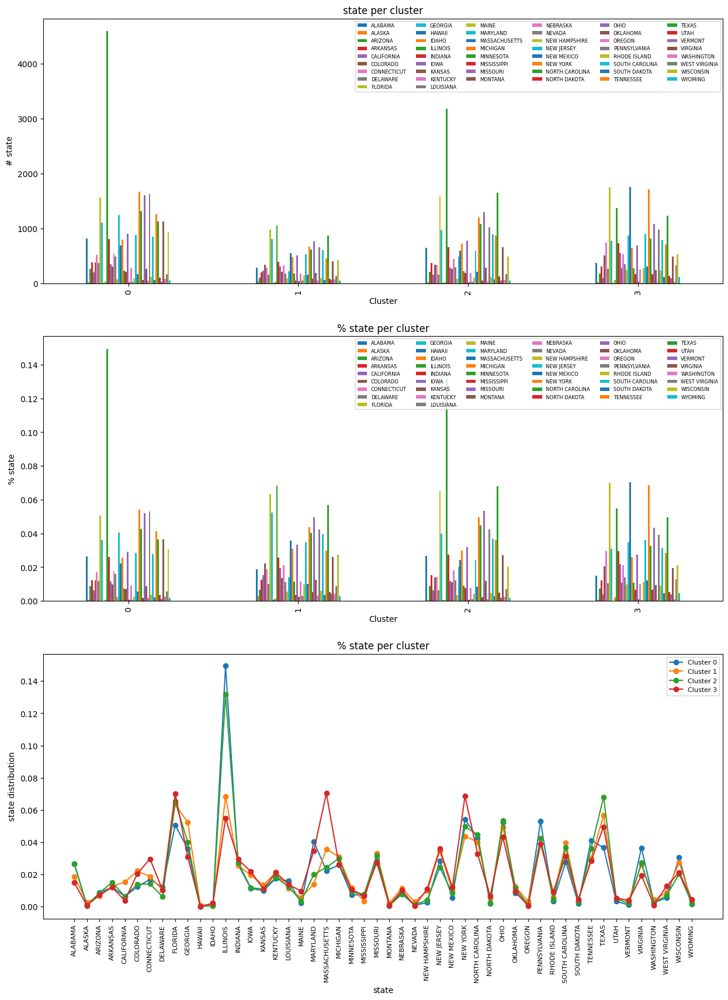

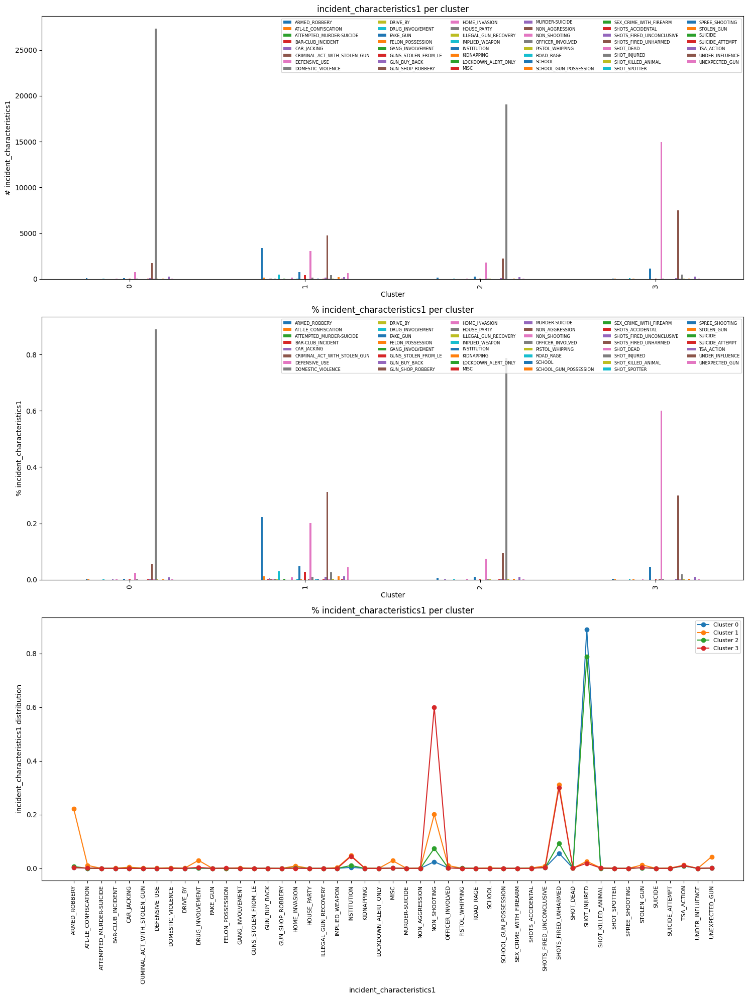

Indicators Model


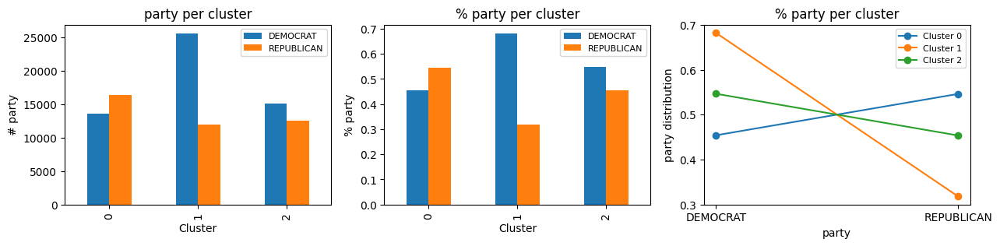

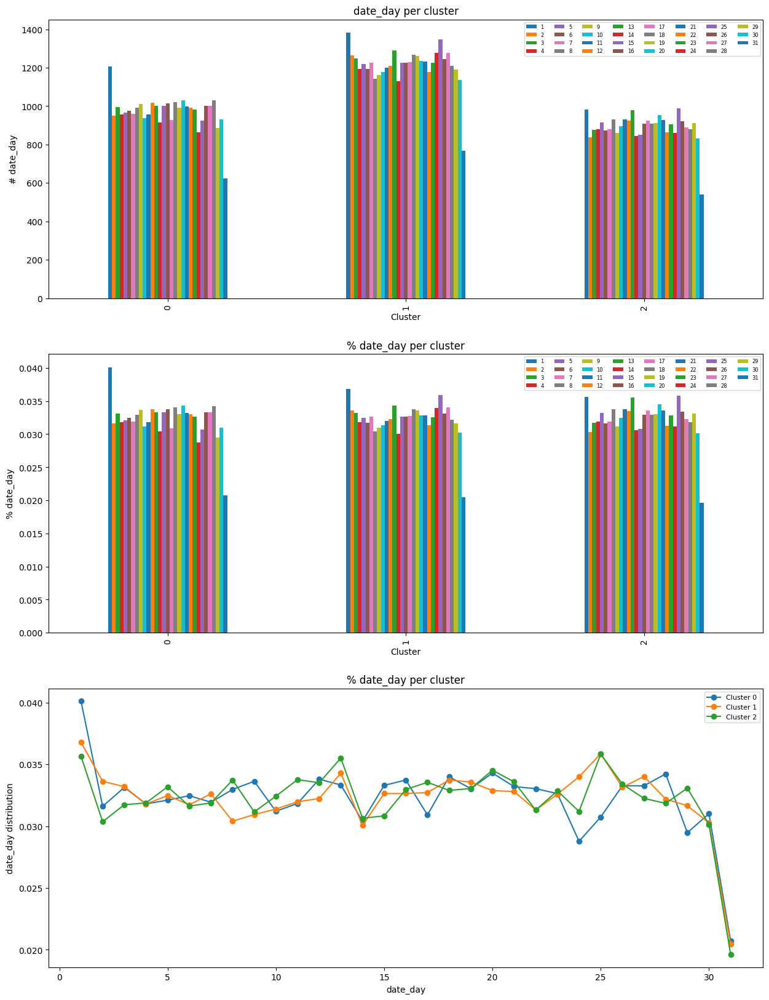

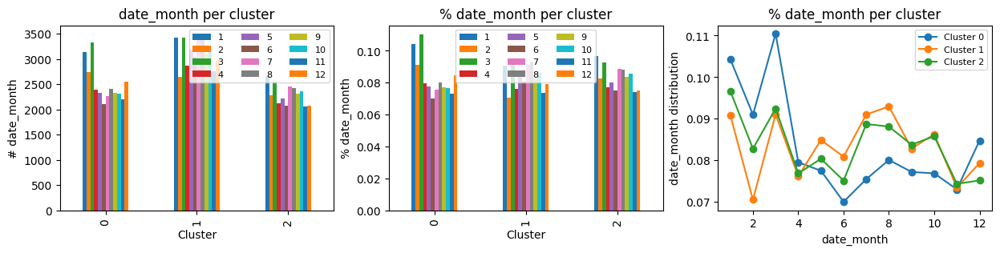

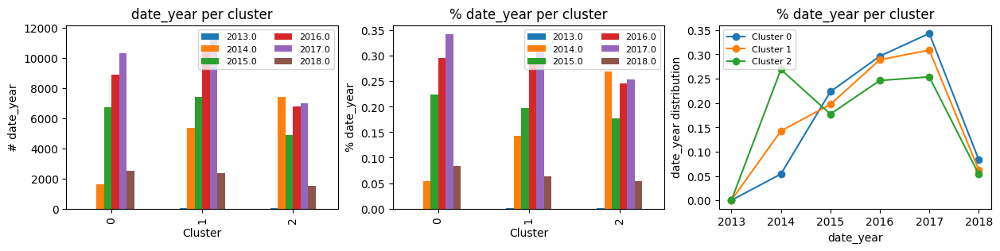

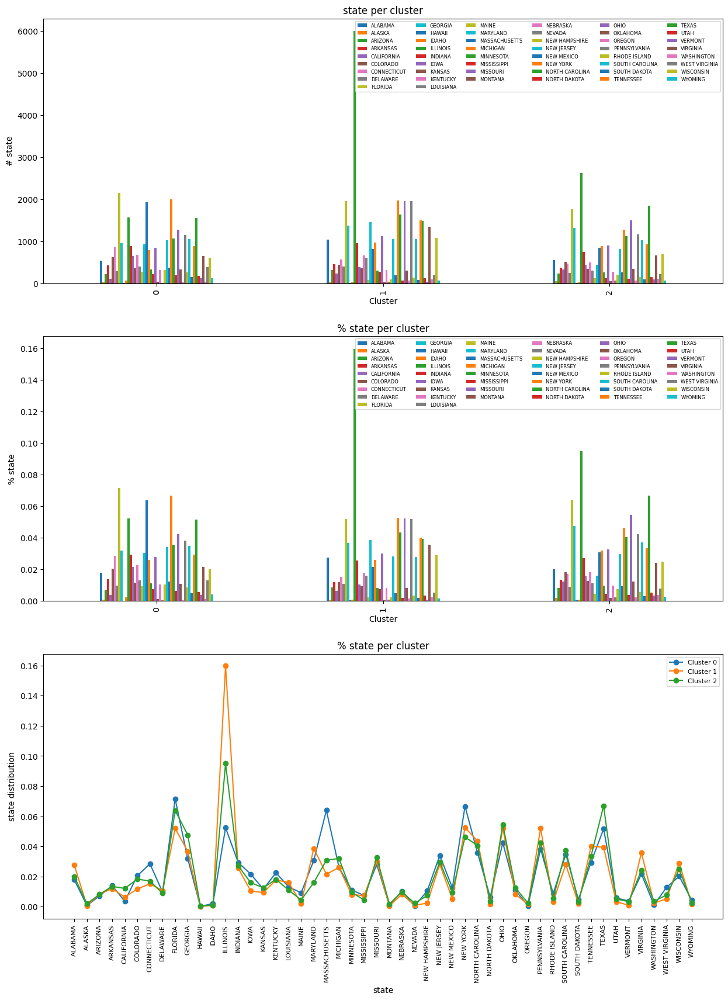

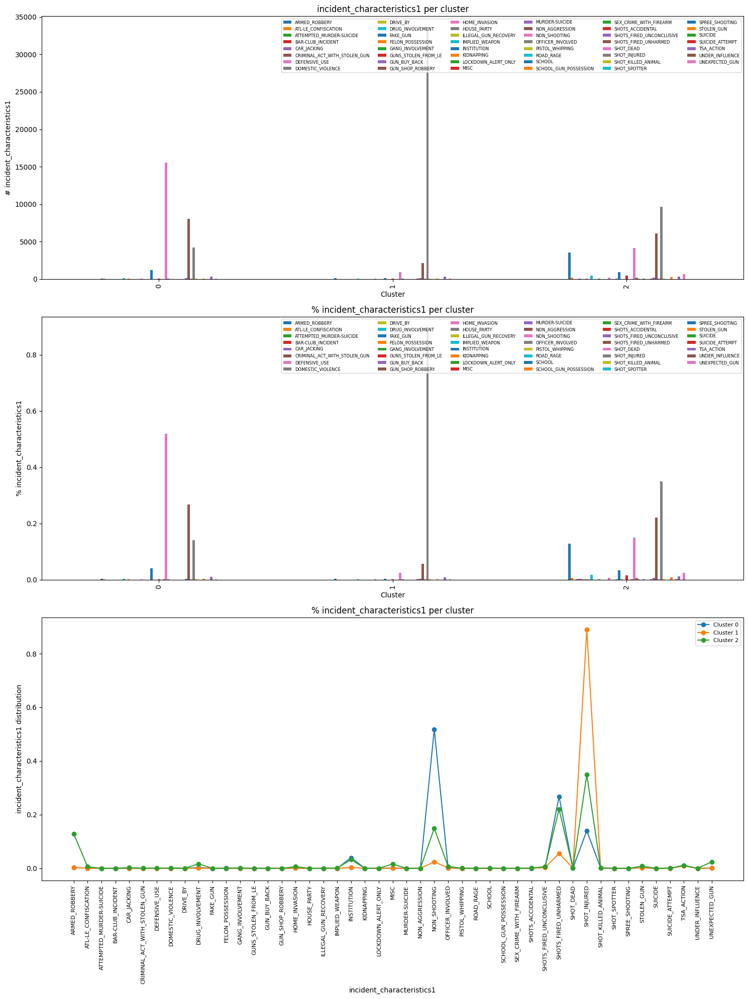

Original Reduced Model


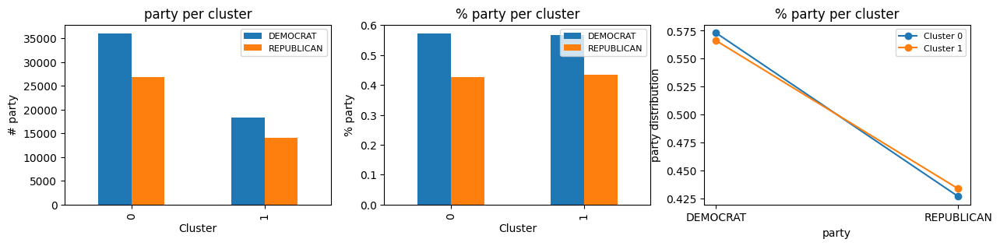

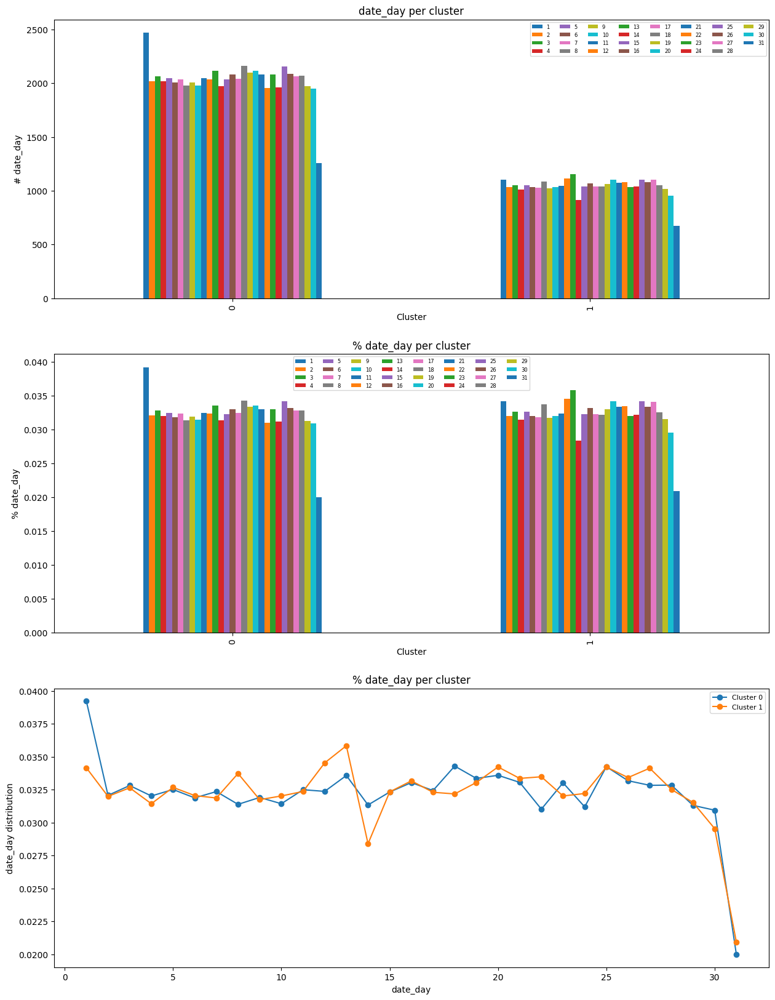

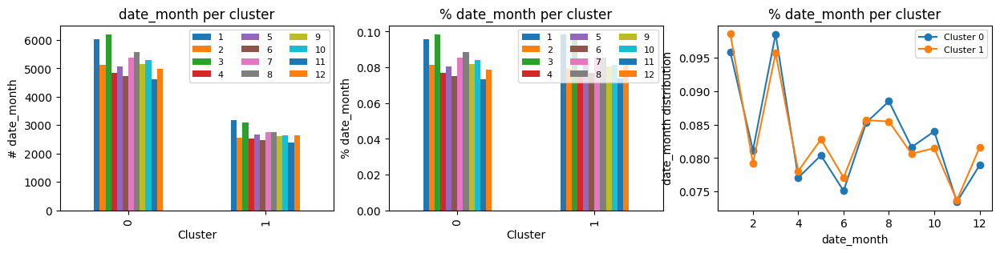

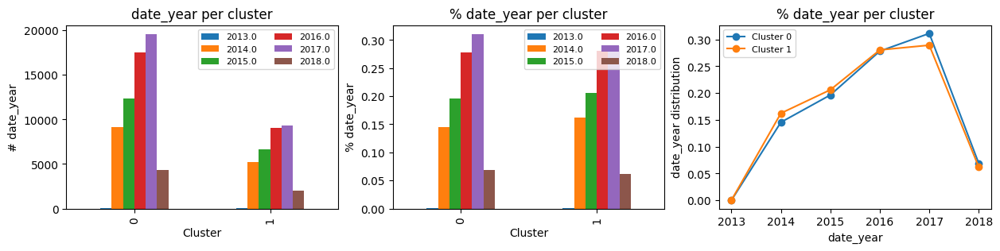

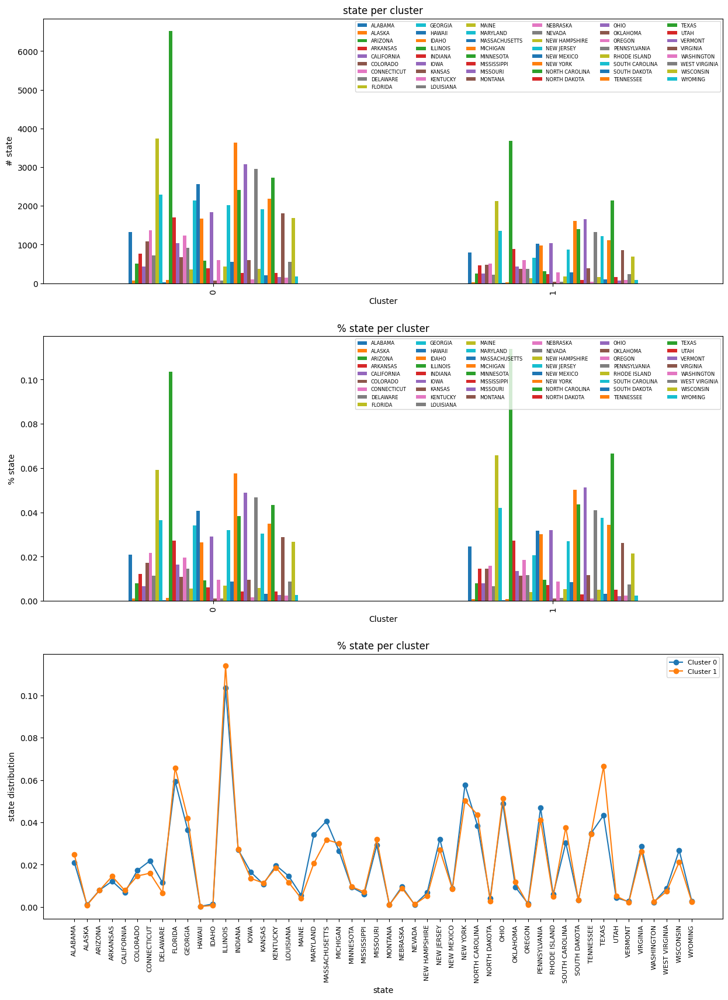

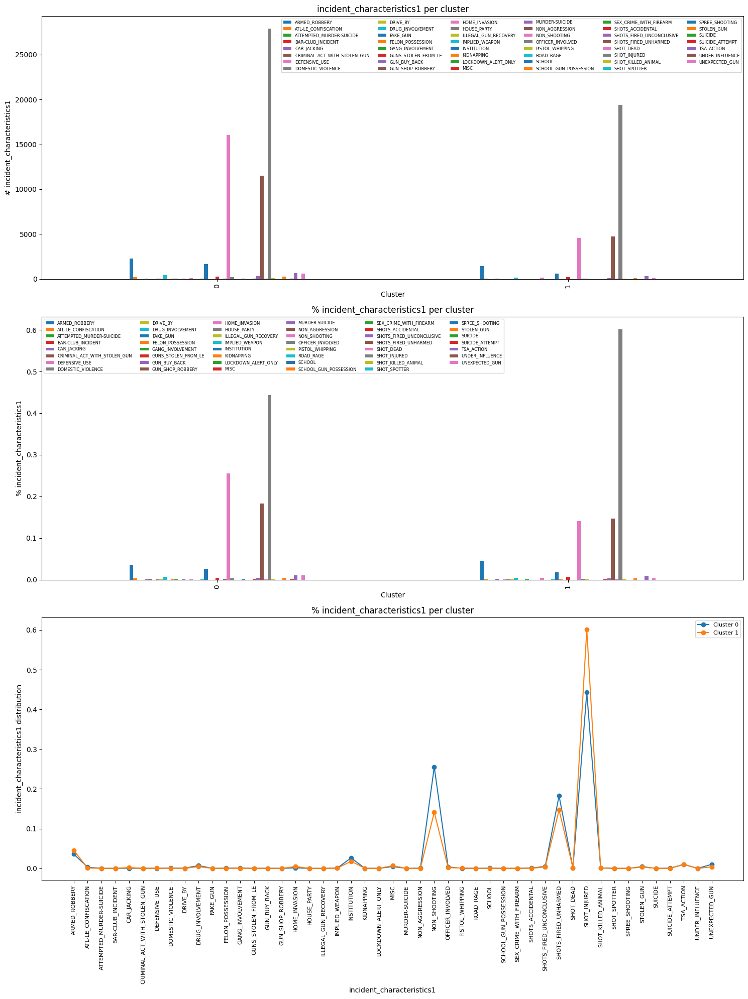

Augmented Reduced Model


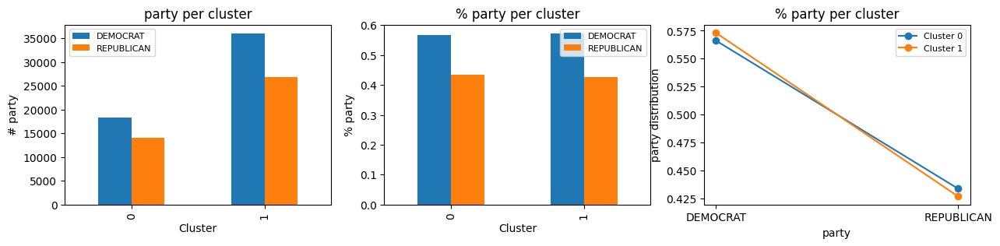

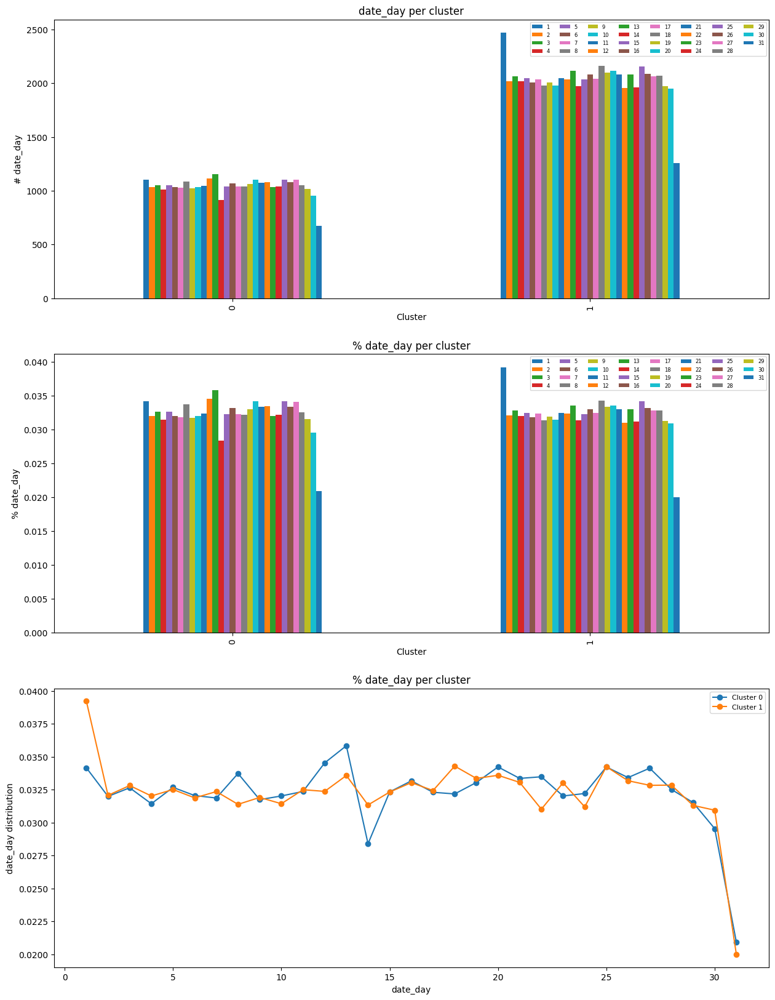

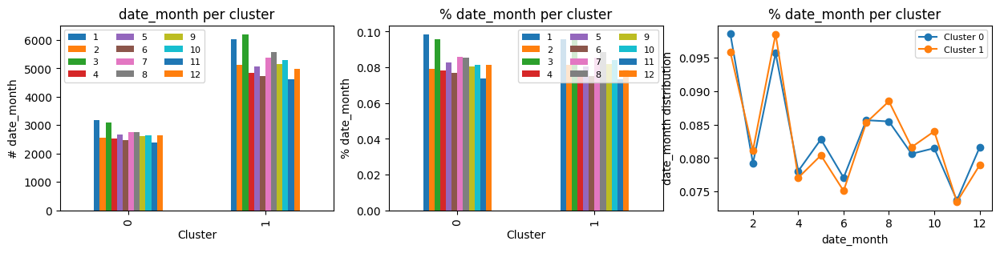

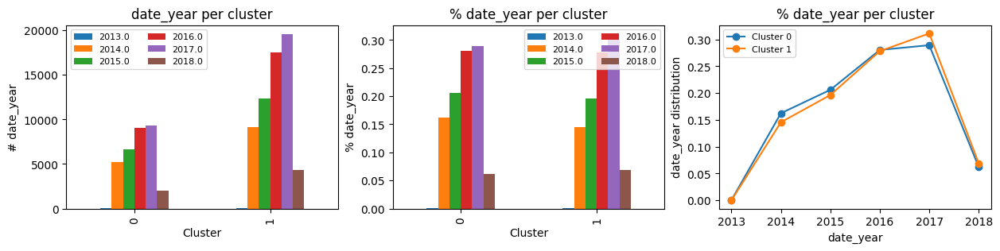

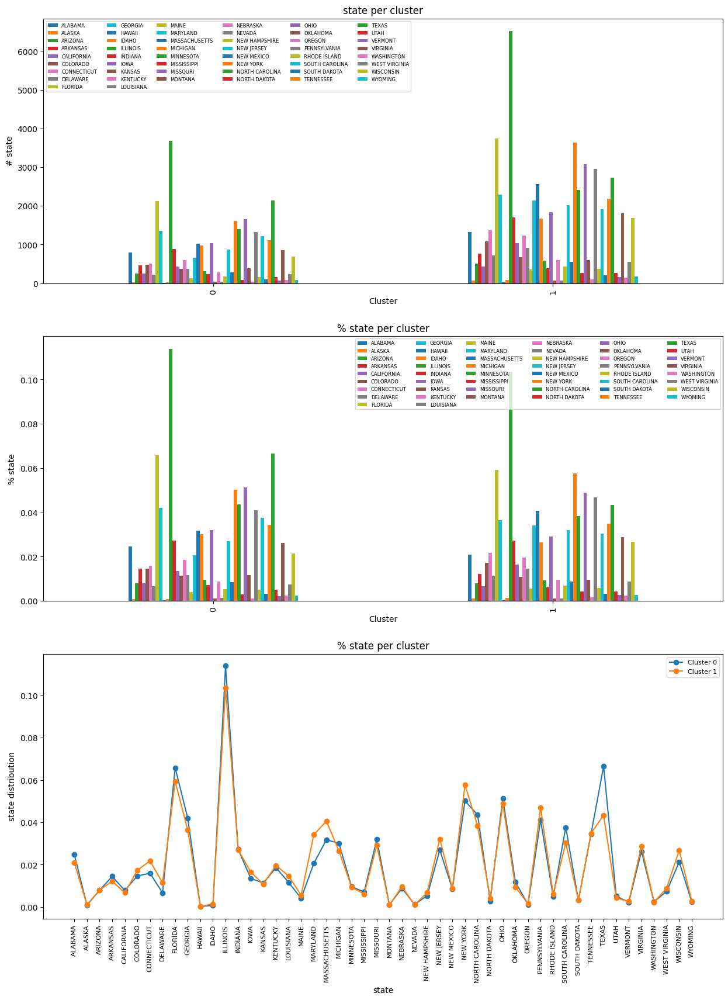

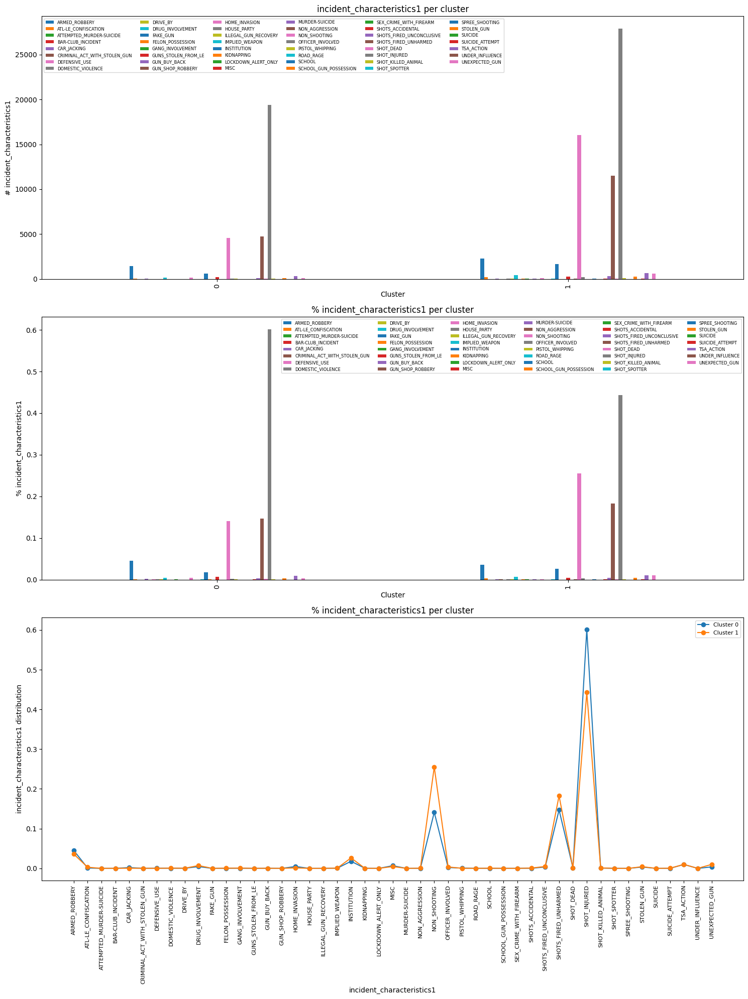

Indicators Reduced Model


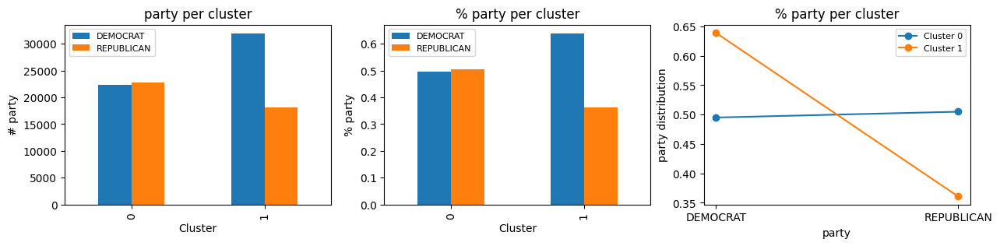

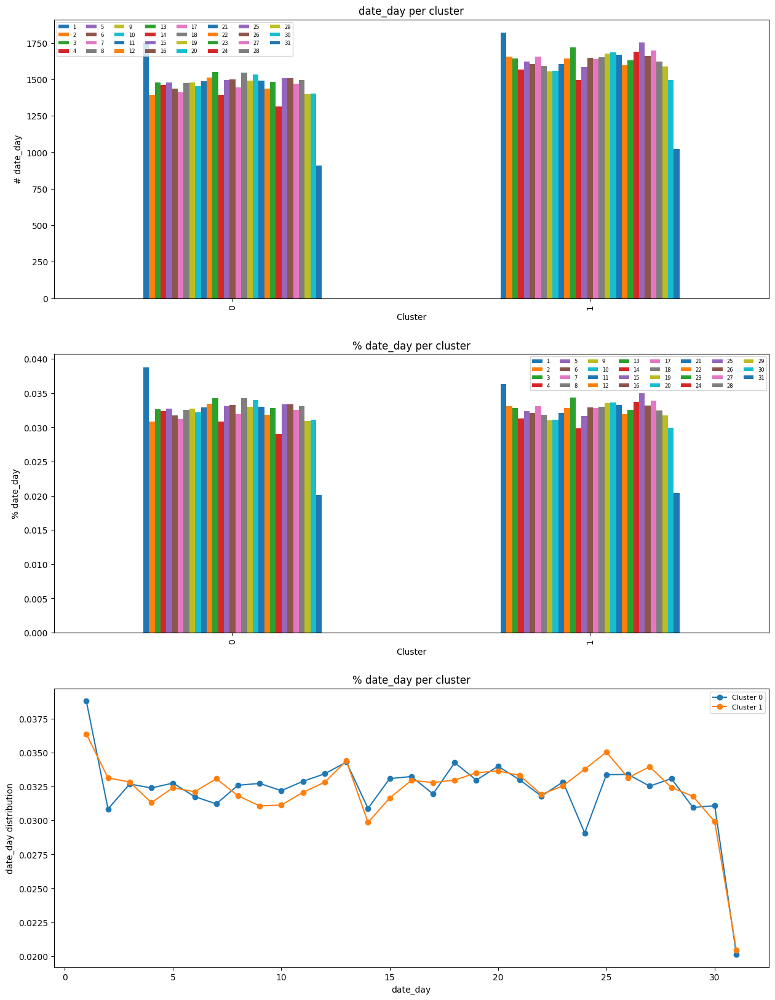

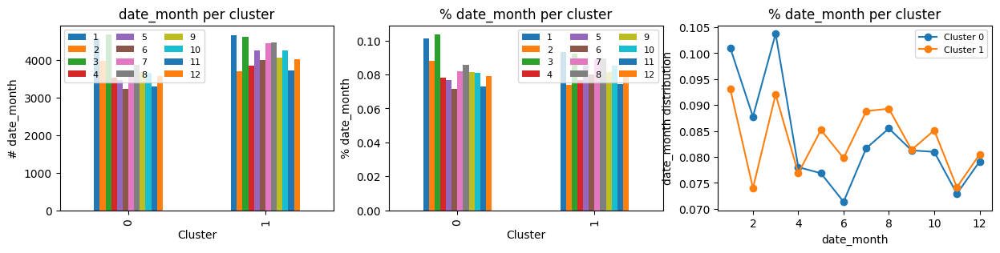

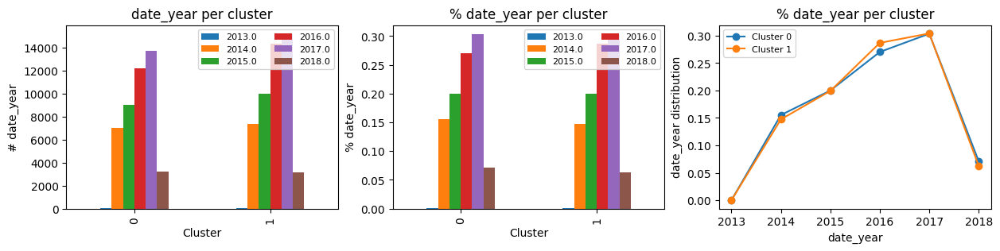

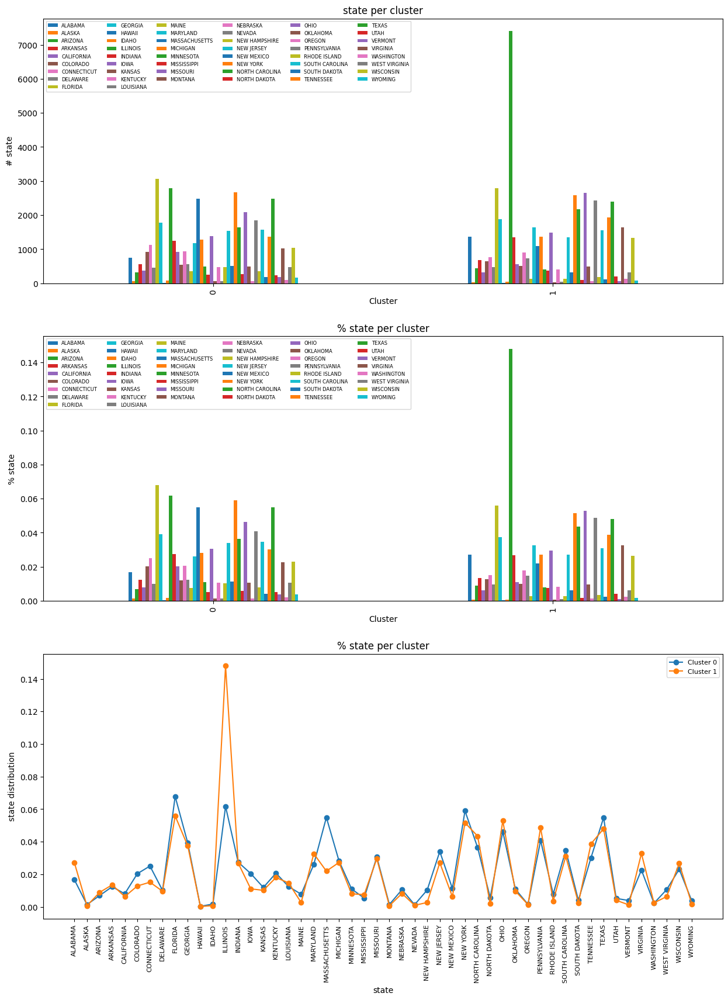

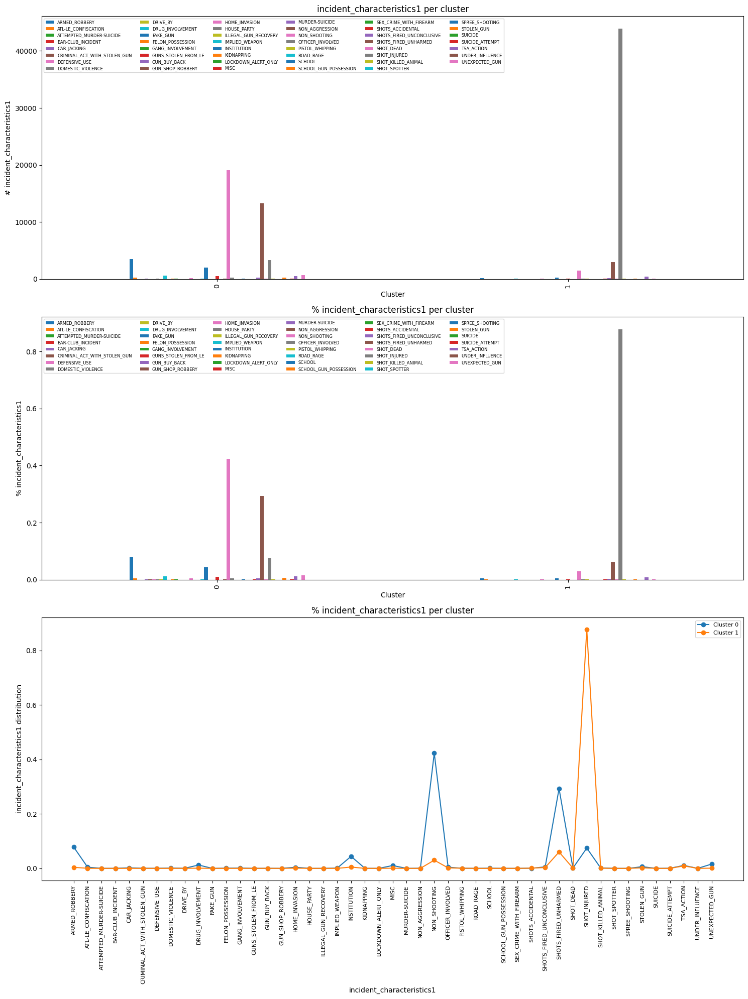

Original Model 2


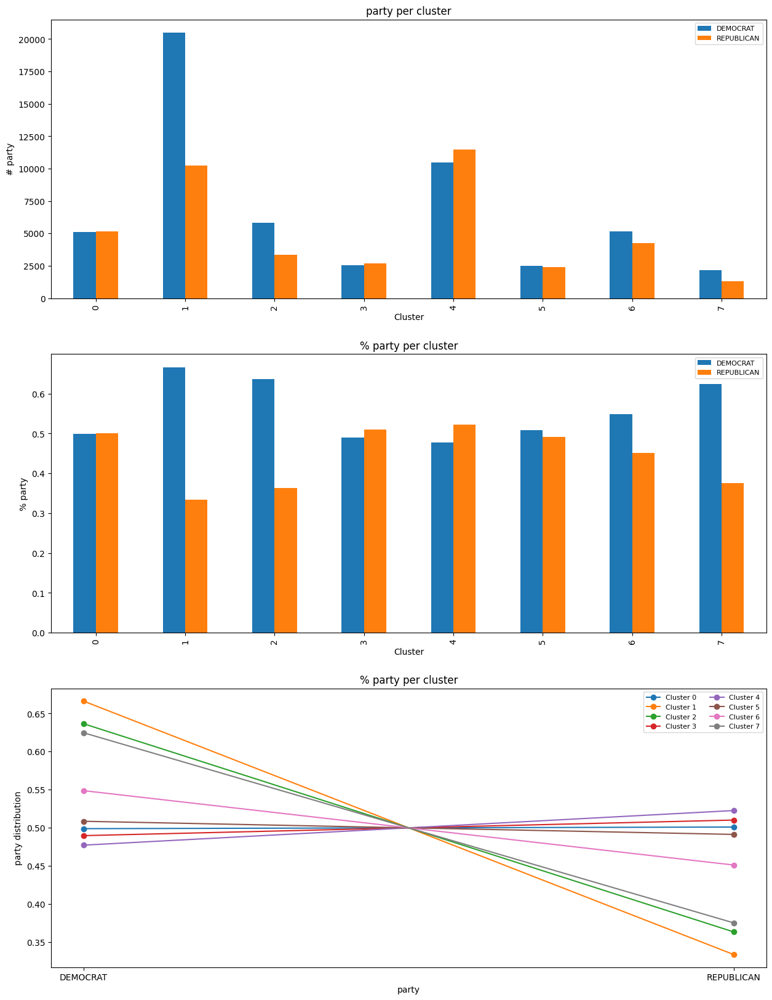

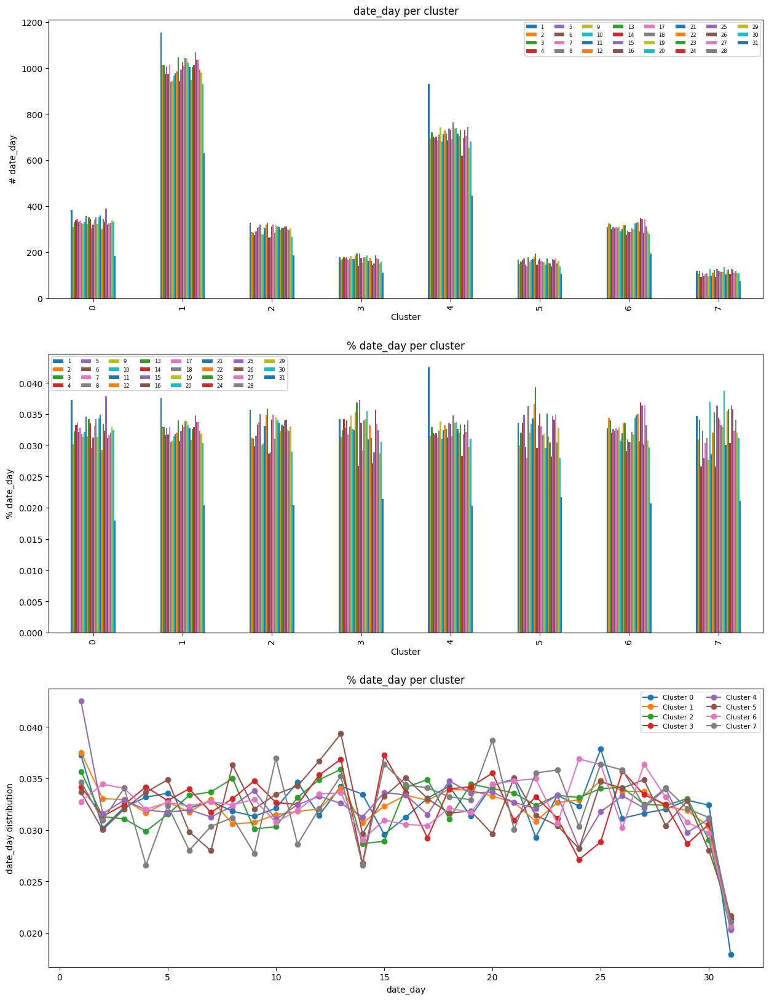

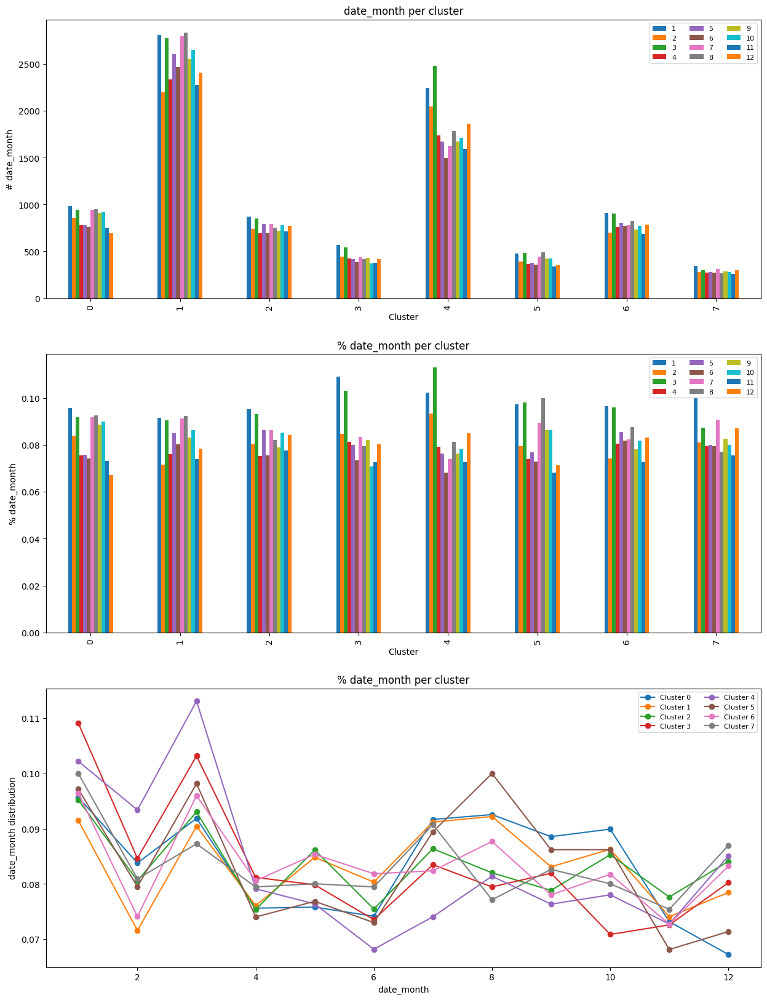

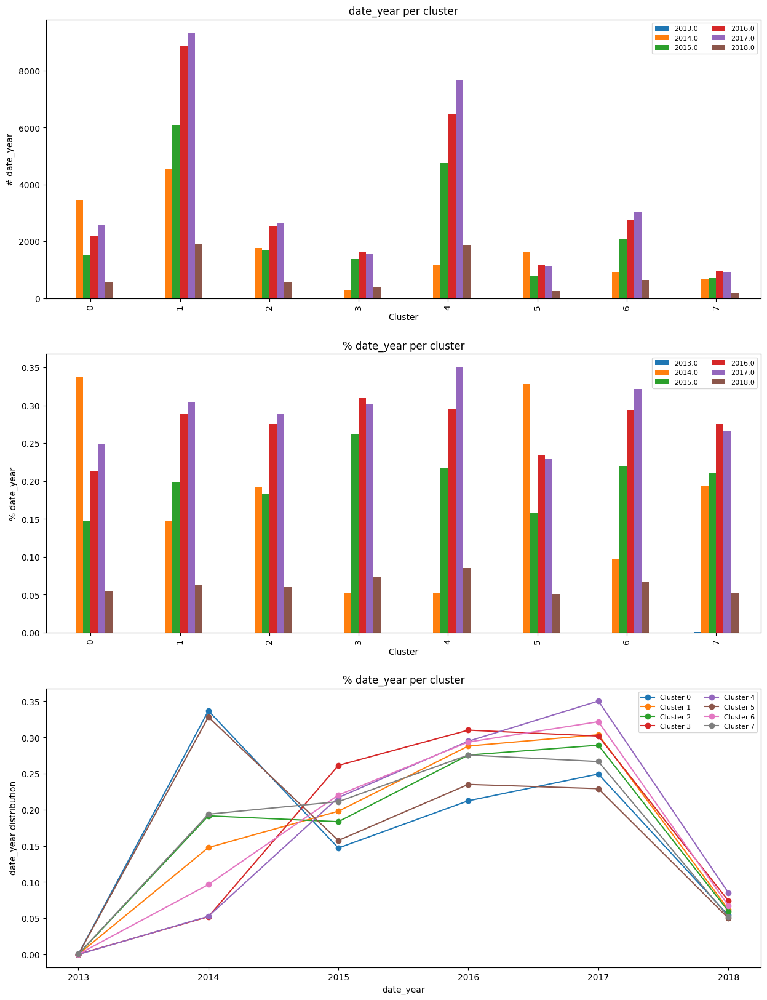

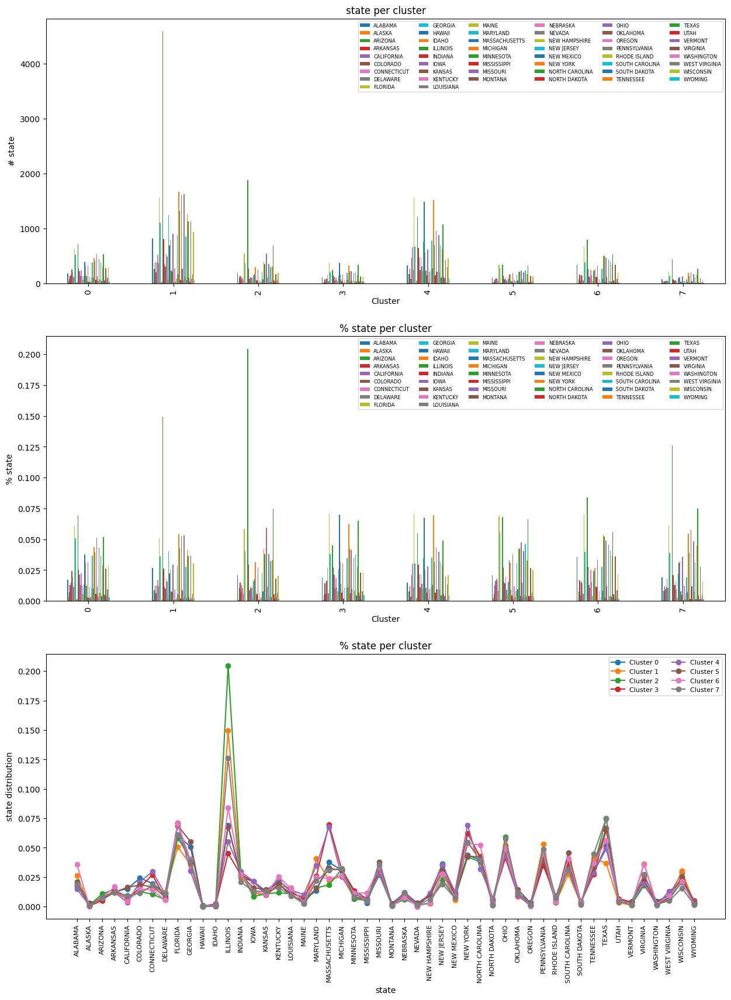

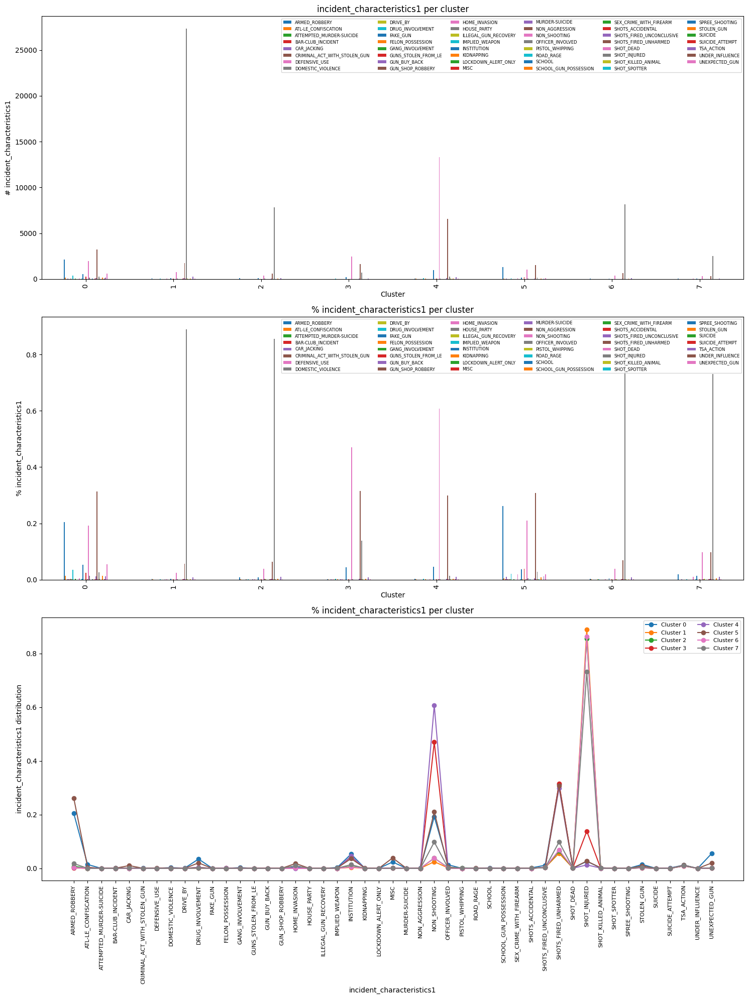

Augmented Model 2


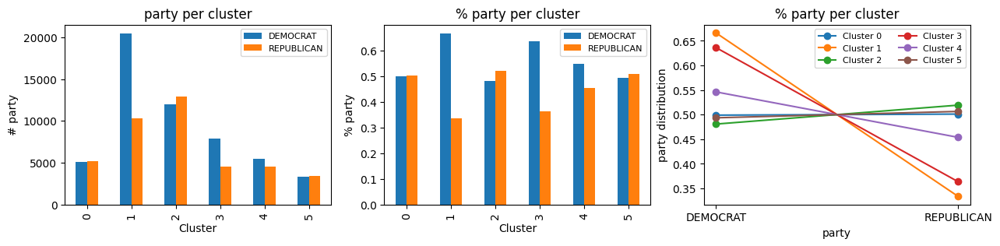

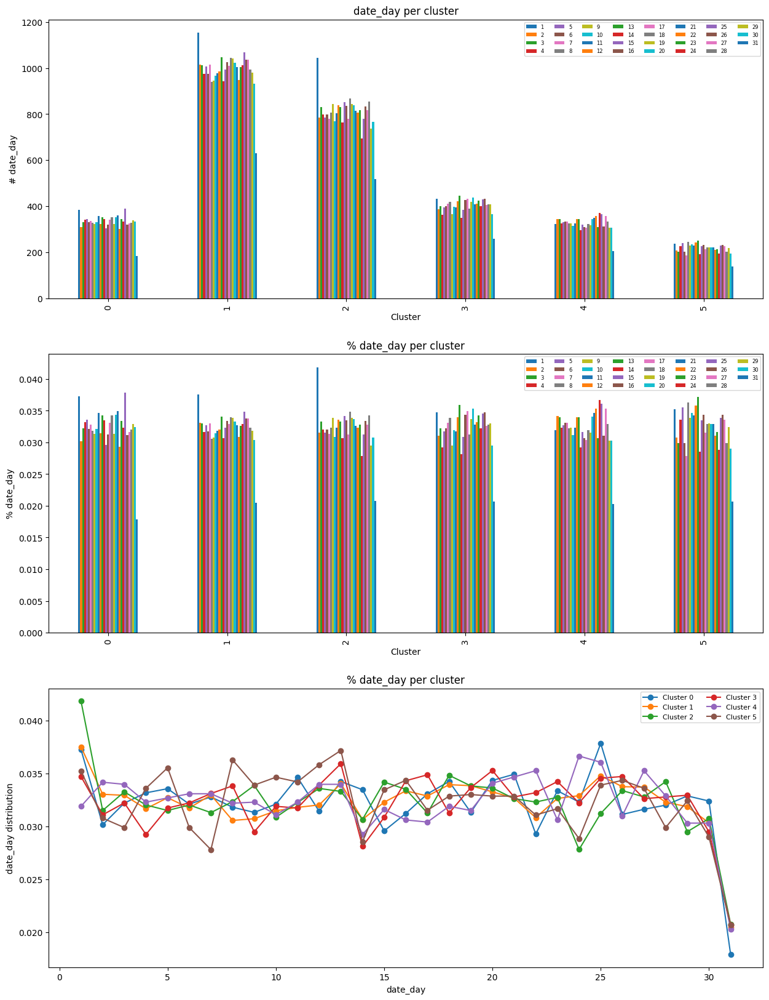

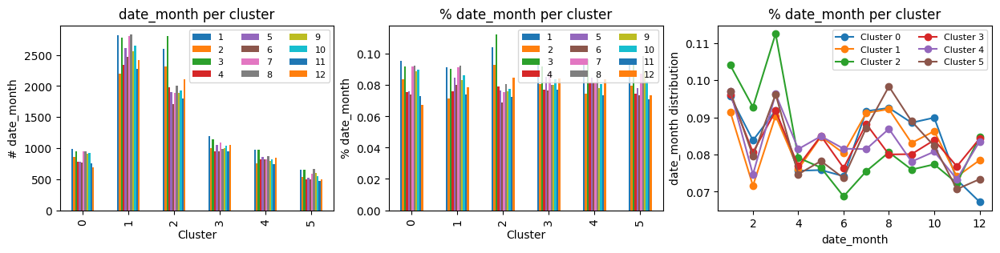

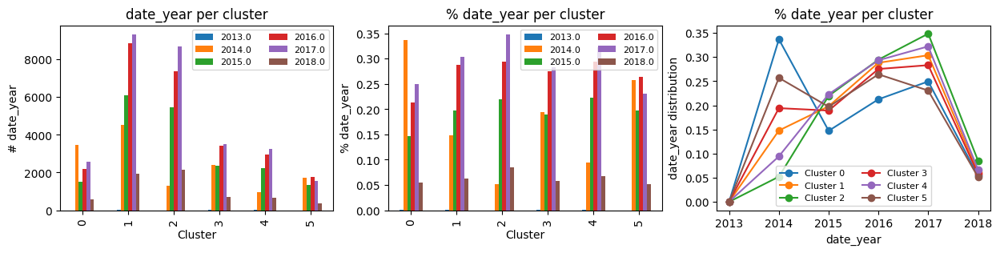

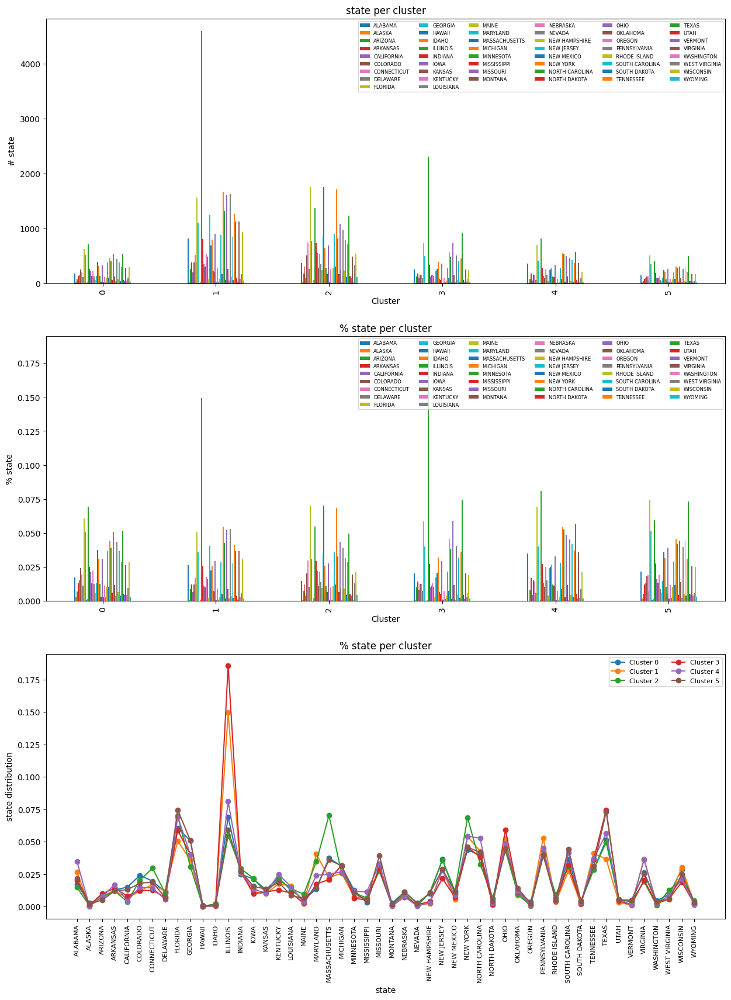

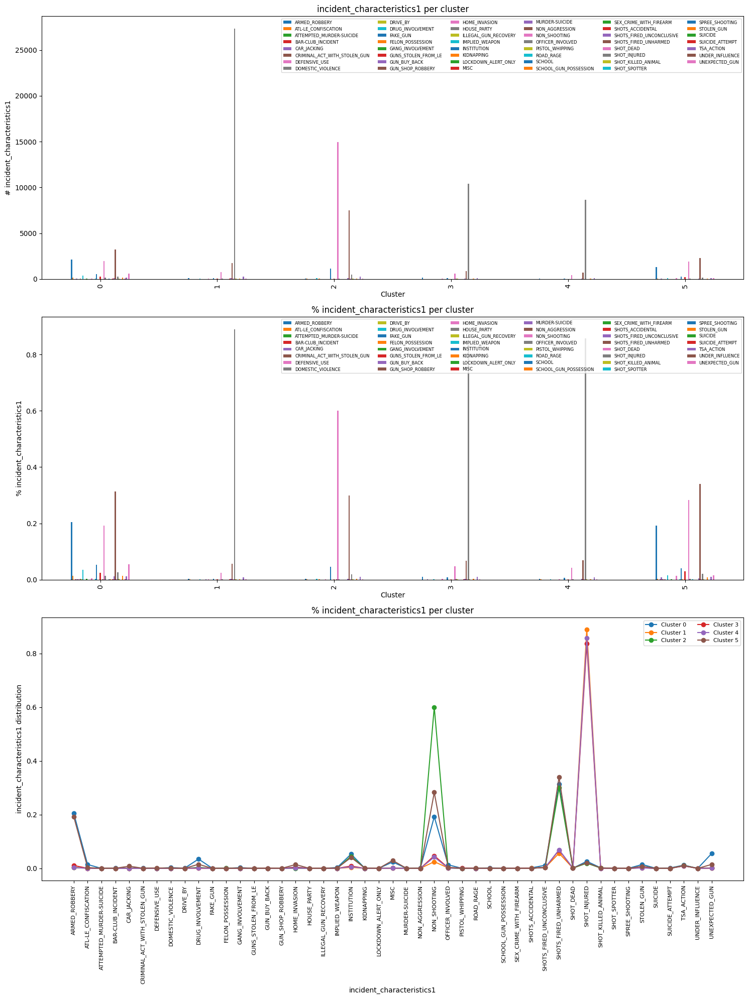

Indicators Model 2


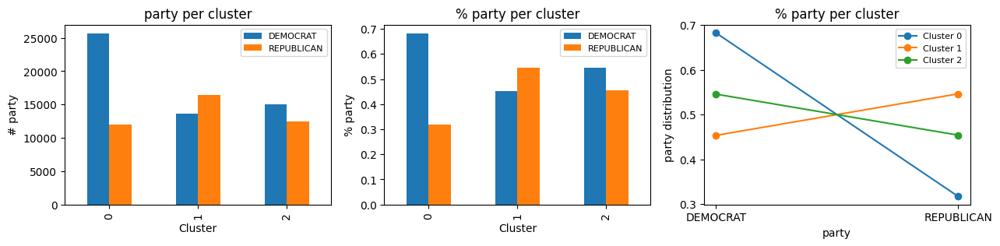

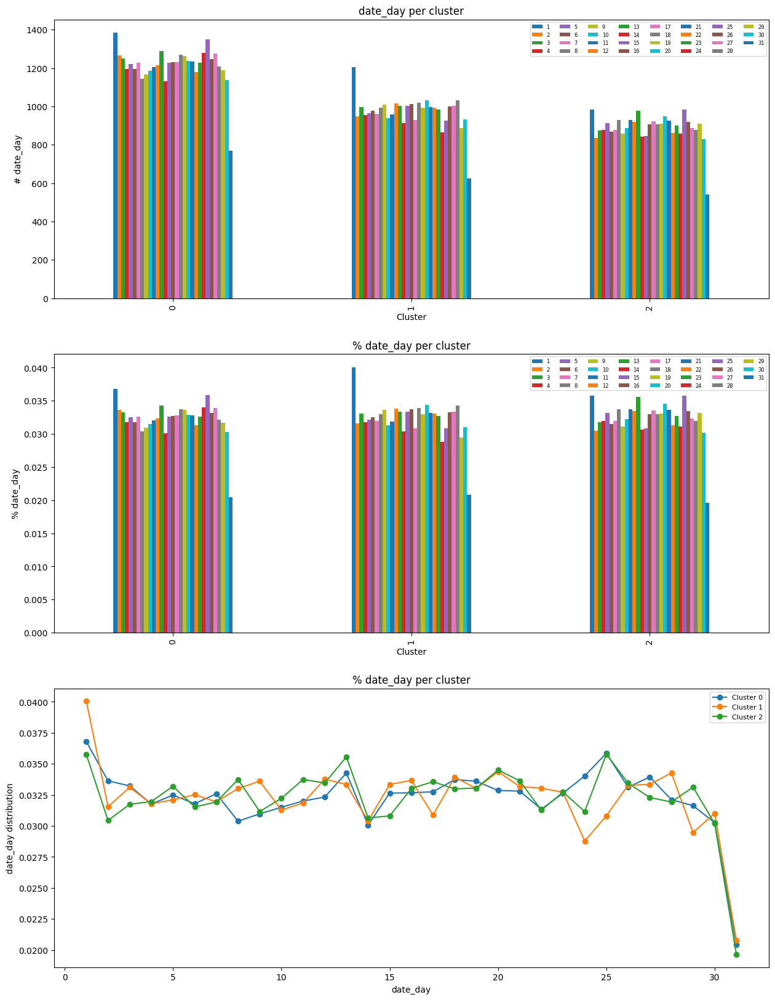

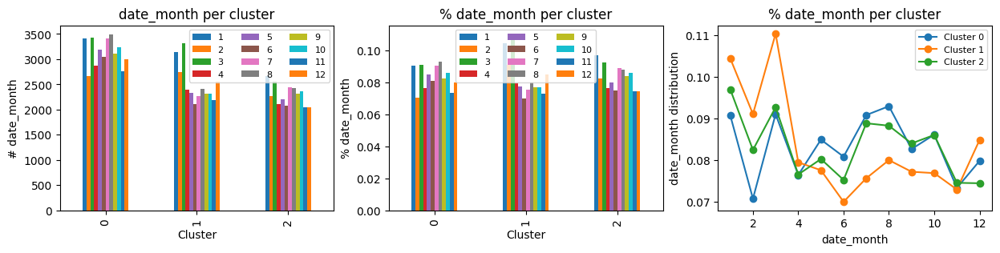

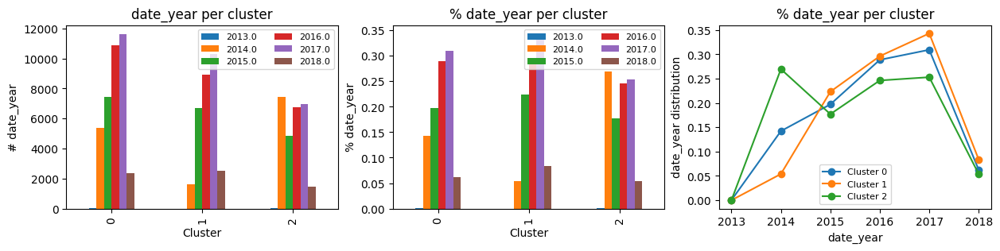

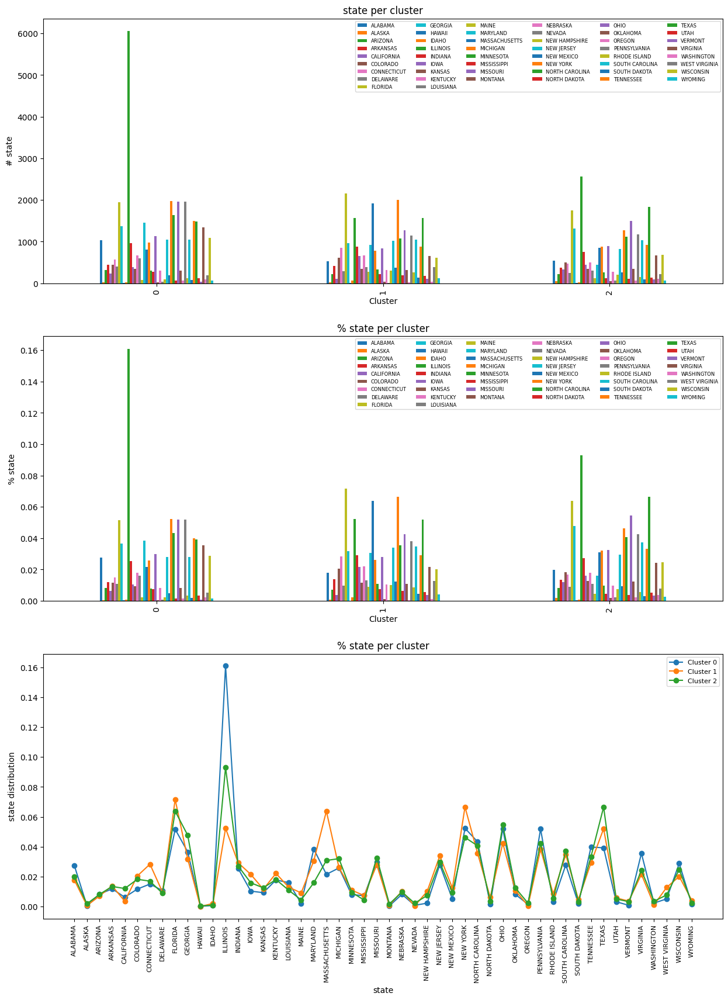

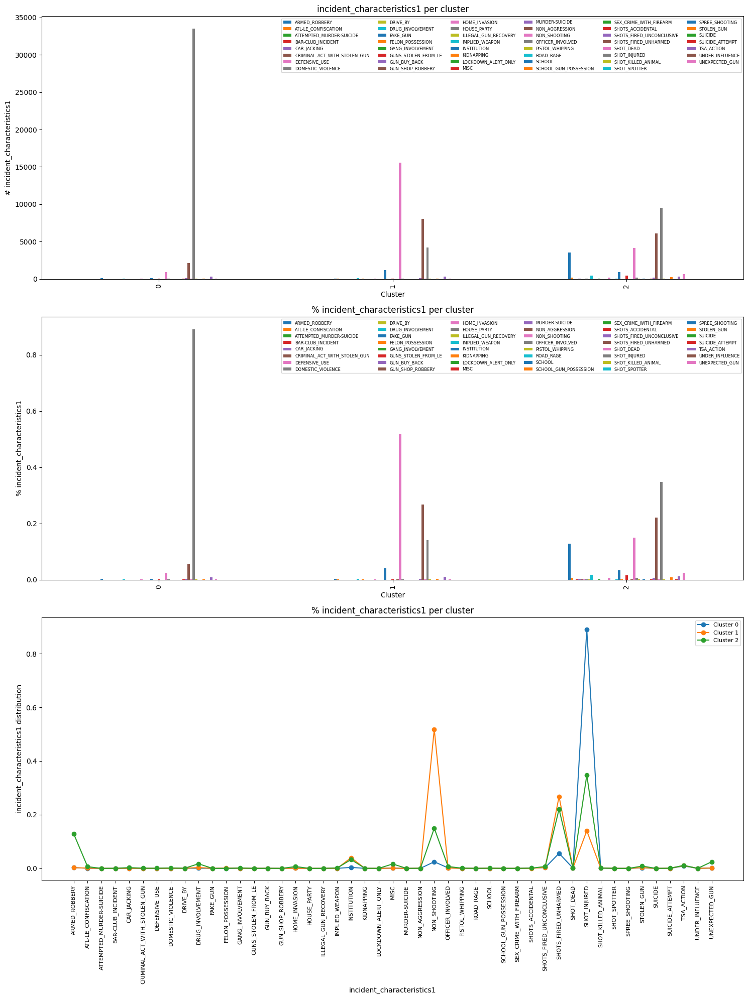

Original Reduced Model 2


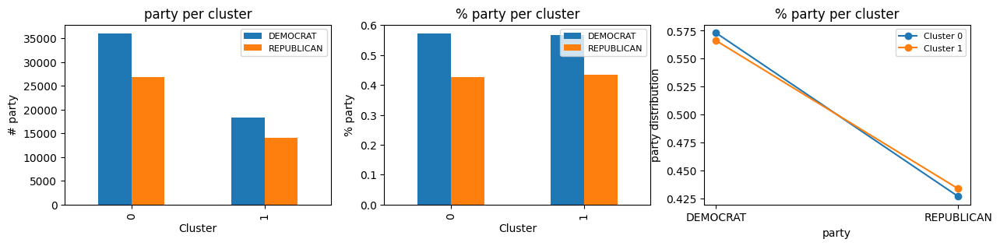

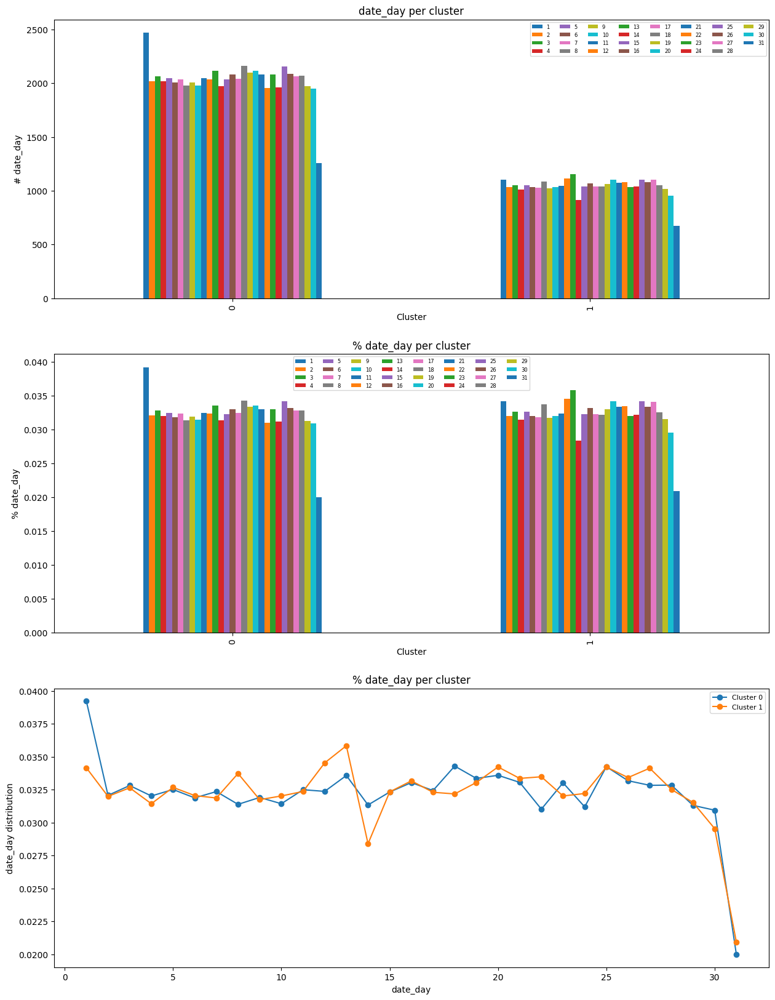

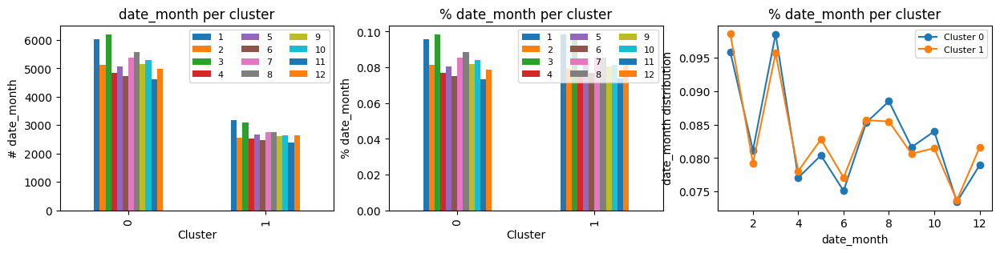

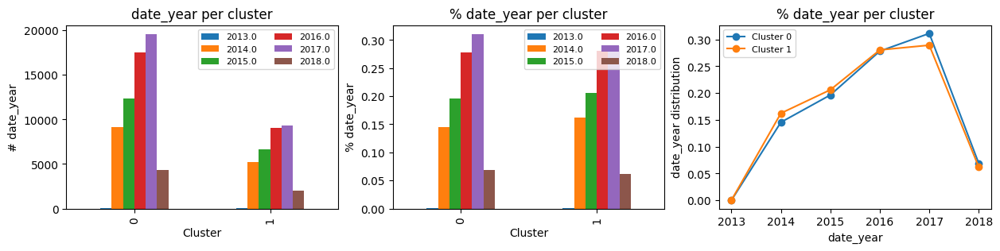

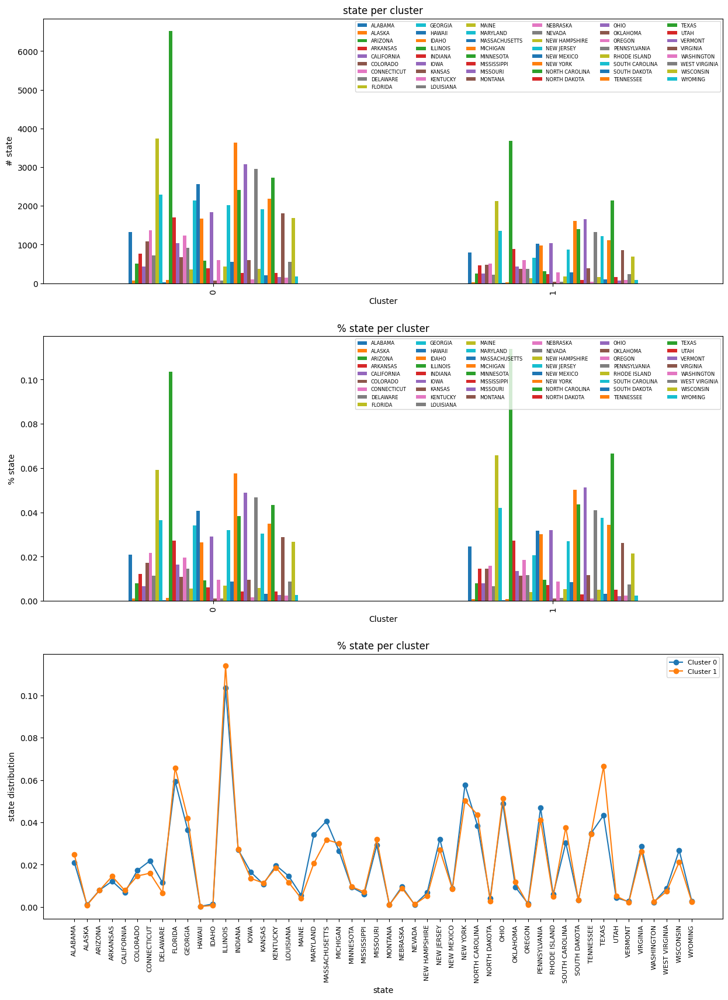

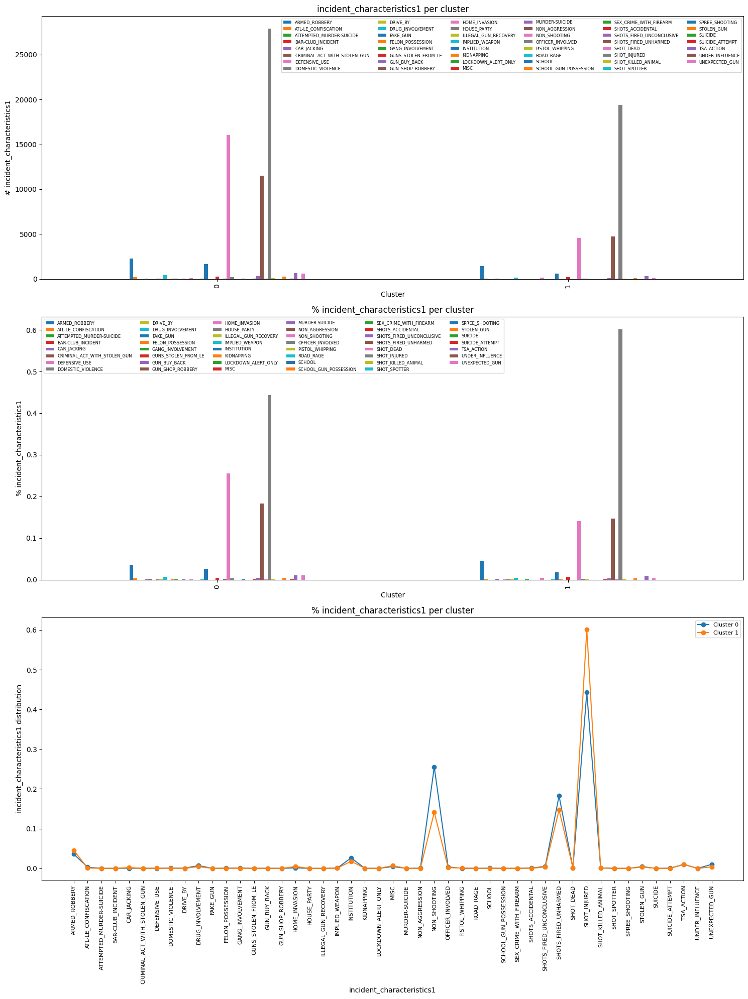

Augmented Reduced Model 2


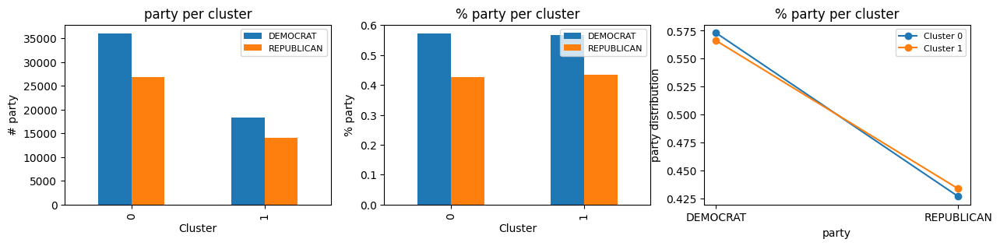

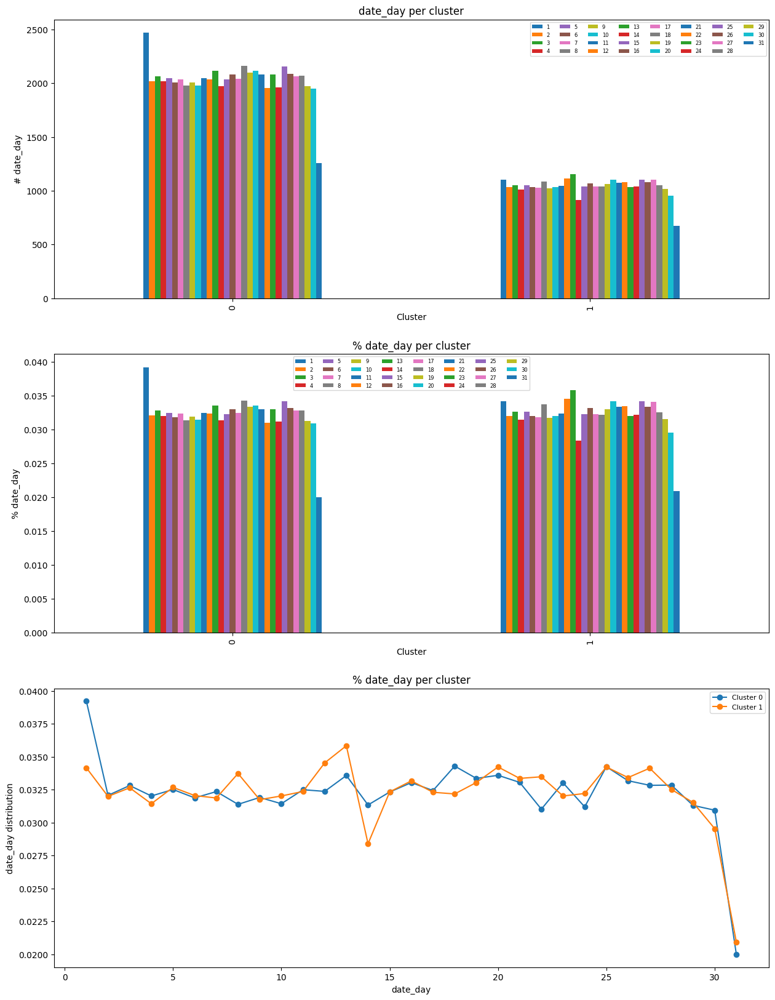

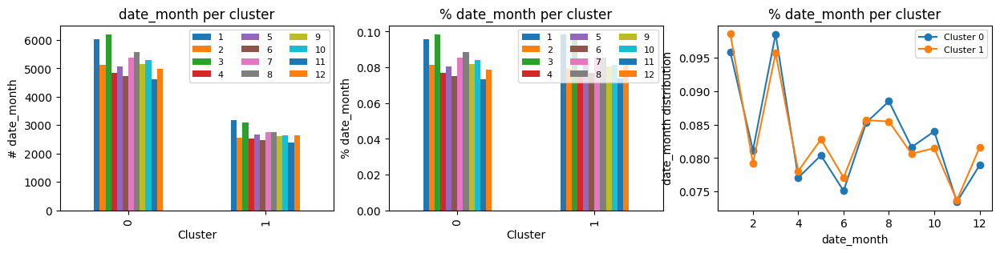

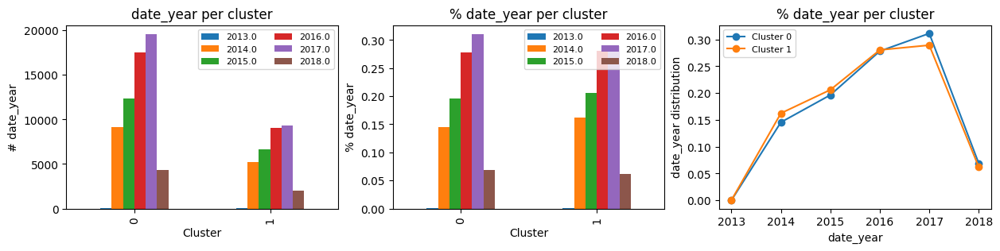

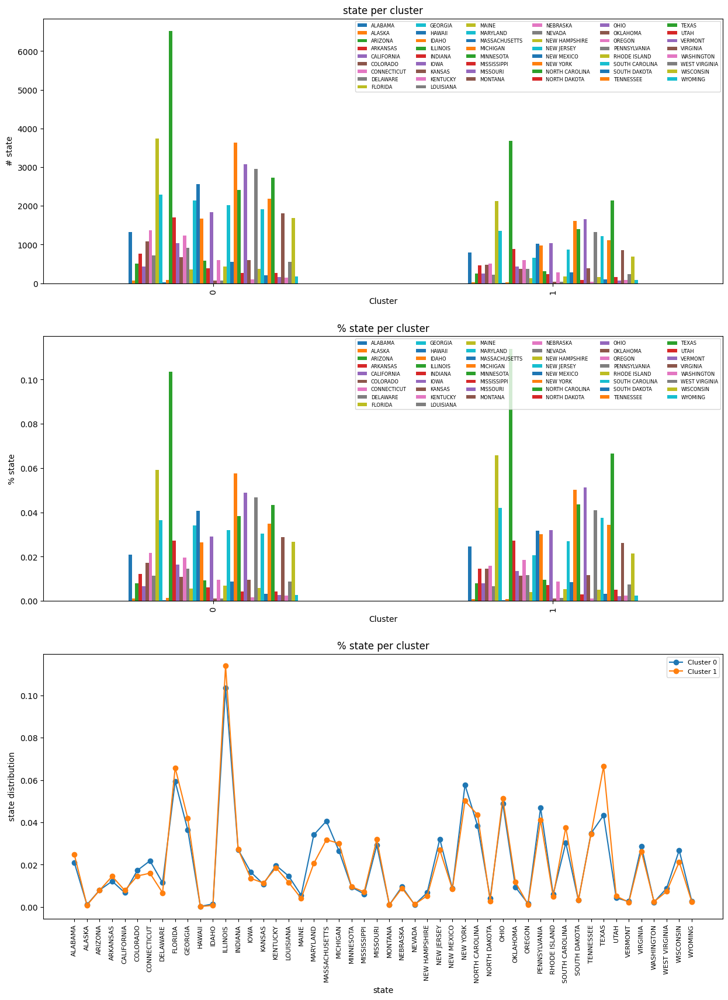

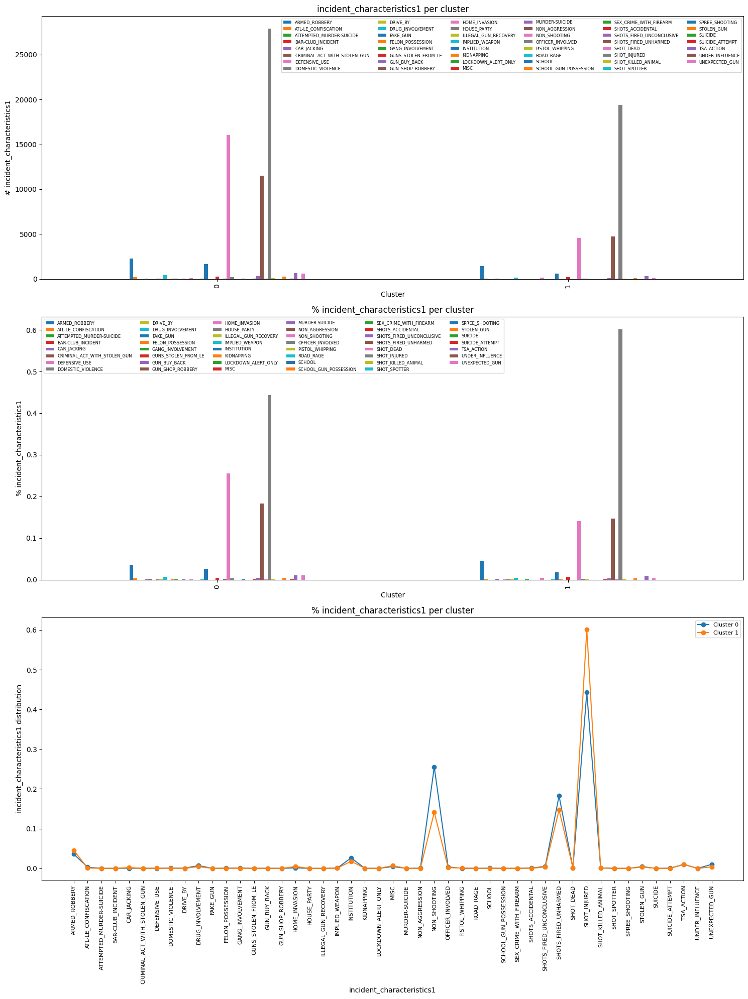

Indicators Reduced Model 2


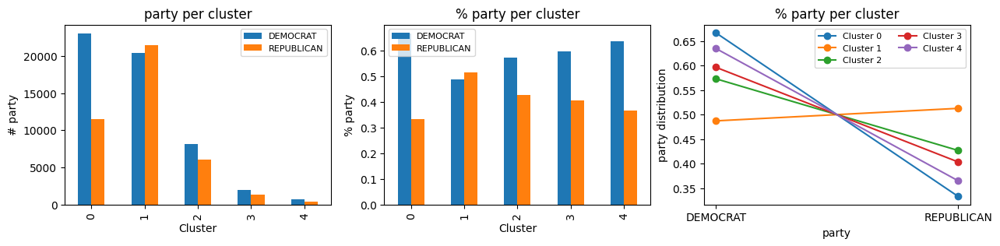

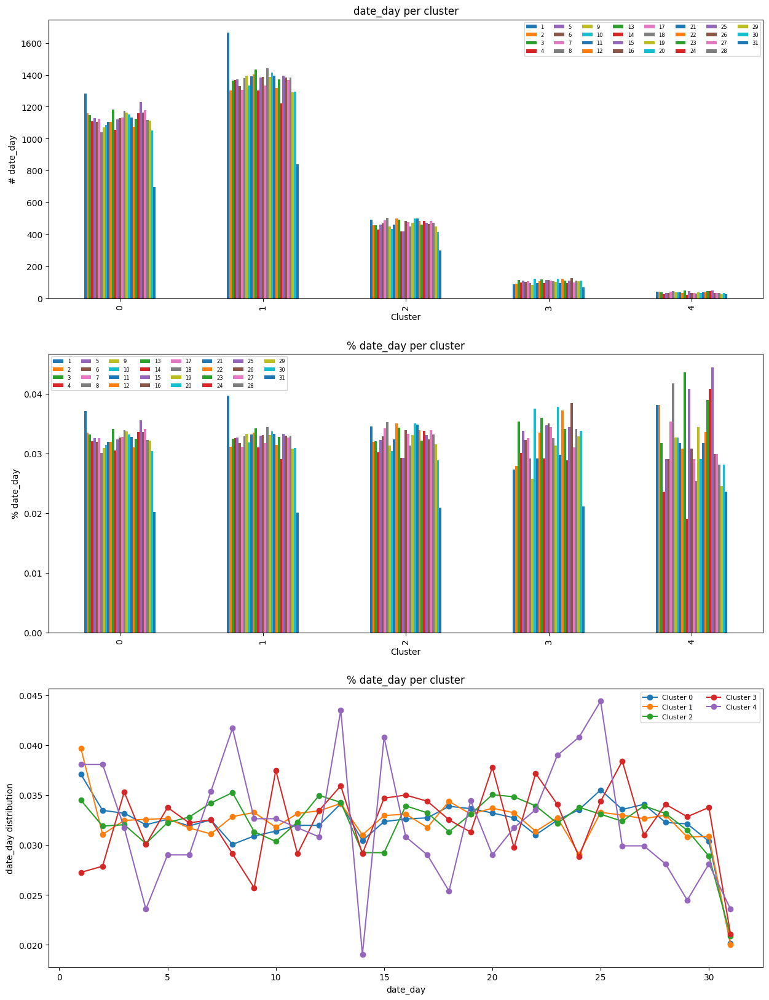

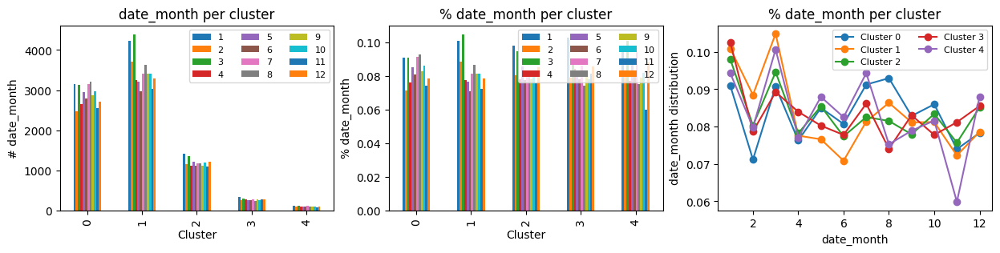

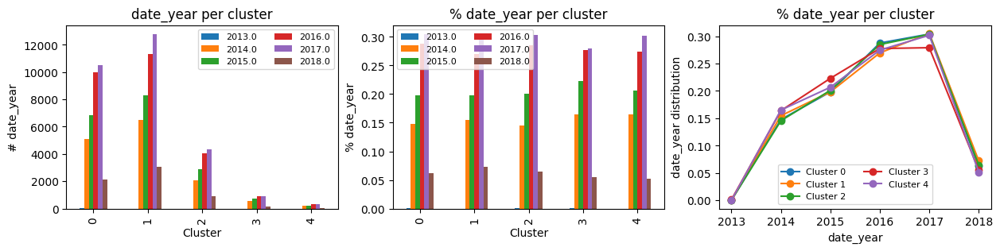

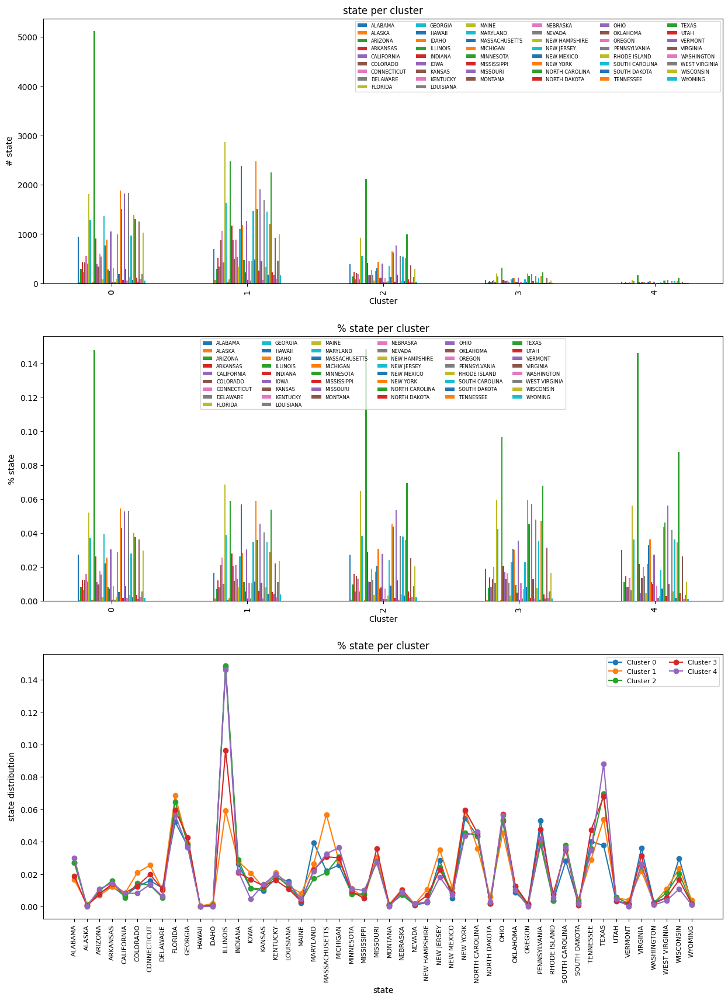

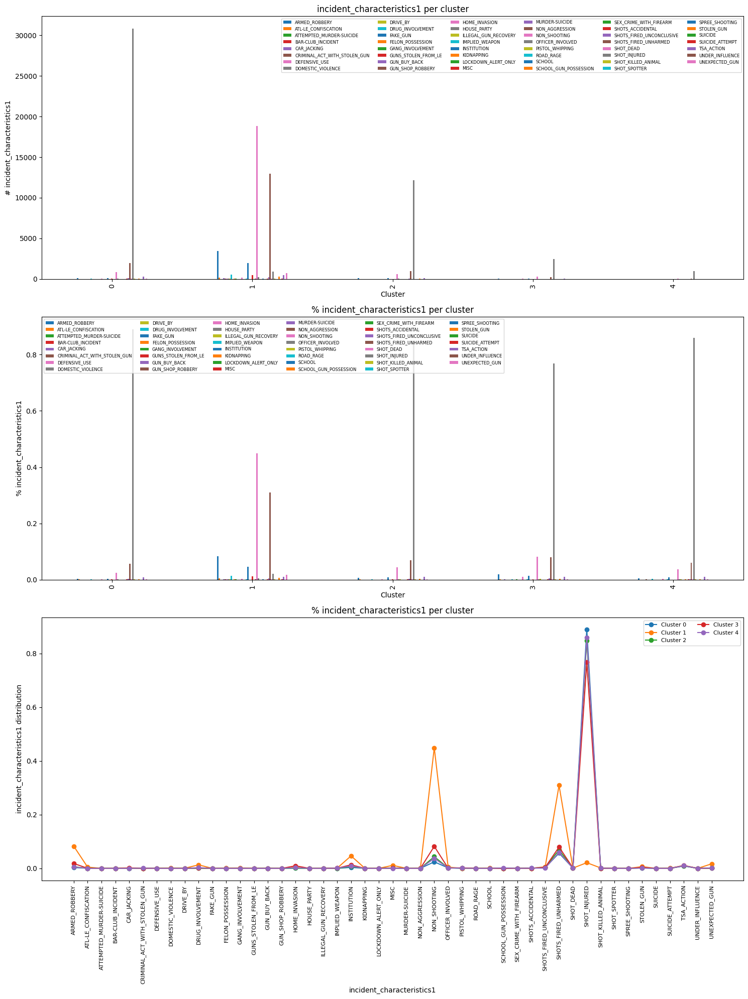

In [47]:
cat_cols = ['date_month', 'date_day', 'date_year', 'congressional_district', 'state',
            'incident_characteristics1', 'city_or_county', 'party']

cat_cols_f = ['party', 'date_day', 'date_month', 'date_year', 'state', 'incident_characteristics1']

df_c = df_init[cat_cols]

all_models = best_models+best_model2s
n_models = len(all_models)
model_names = MODEL_NAMES+[s+' 2' for s in MODEL_NAMES]

for model, model_name in zip(all_models, model_names):
    print(model_name)
    for cat in cat_cols_f:

        xt_pct = pd.crosstab(model.labels_, df_c[cat])

        a = xt_pct.values
        cols = xt_pct.columns
        ps = []
        for i in range(len(cols)):
            ps.append([])

        for row in a:
            dist = row / np.sum(row)
            for i in range(len(cols)):
                ps[i].append(dist[i])

        d = {}
        i = 0
        for c in cols:
            d[c] = ps[i]
            i += 1

        xt_pct_p = pd.DataFrame(d)

        distrs = xt_pct_p.values
        cols = xt_pct_p.columns
        avg_distr = np.mean(distrs, axis=0)
    #----------------------------------------------

        if (cat == 'party' or cat == 'date_month' or cat == 'date_year') and (len(model.cluster_centers_) <= 6):
            fig, axes = plt.subplots(1, 3, figsize=(15, 3))
        else:
            fig, axes = plt.subplots(3, 1, figsize=(15, 20))
        #fig.suptitle(model_name, fontsize=16)

        if len(cols) > 30:
            fs = 6
        else:
            fs = 8

        if cat == 'state' or cat == 'incident_characteristics1':
            ncol = 6
        else:
            ncol = ceil(len(cols) / 4)

        xt_pct.plot(kind='bar', stacked=False, title=f'{cat} per cluster', ax=axes[0])
        
        axes[0].legend(fontsize=fs, loc='best', ncol=ncol)
        #axes[0].legend().set_visible(False)
        axes[0].set_xlabel('Cluster')
        axes[0].set_ylabel(f'# {cat}')

        xt_pct_p.plot(kind='bar', stacked=False, title=f'% {cat} per cluster', ax=axes[1])
        axes[1].legend(fontsize=fs, loc='best', ncol=ncol)
        #axes[1].legend().set_visible(False)
        axes[1].set_xlabel('Cluster')
        axes[1].set_ylabel(f'% {cat}')

        for i in range(len(model.cluster_centers_)):
            line, = axes[2].plot(cols, distrs[i], marker='o', linestyle='-', label=f'Cluster {i}')
            if cat == 'state' or cat == 'incident_characteristics1':
                axes[2].set_xticks(range(len(cols)), cols, rotation=90, fontsize=8)

        ncol = ceil(len(model.cluster_centers_) / 4)
        axes[2].legend(fontsize=8, loc='best', ncol=ncol)
        axes[2].set_xlabel(cat)
        axes[2].set_ylabel(f'{cat} distribution')
        axes[2].set_title(f'% {cat} per cluster')

    plt.tight_layout()
    plt.show()

In [48]:
summary_stats = pd.DataFrame({
    'Unique Values': df_orig.nunique(),
    'Max Value': df_orig.max(),
    'Min Value': df_orig.min()
})
summary_stats['Possible Values'] = df_orig.apply(lambda col: col.unique() if col.nunique() <= 1500 else None)
summary_stats

,Unique Values,Max Value,Min Value,Possible Values
latitude,54379,48.9399,24.5539,None
longitude,60000,-67.2996,-113.0620,None
min_age_participants,52,52.0000,1.0000,"[28.0, 40.0, 21.0, 22.0, 27.0, 19.0, 45.0, 31...."
avg_age_participants,52,53.0000,2.0000,"[28.0, 45.0, 21.0, 22.0, 27.0, 19.0, 34.0, 43...."
max_age_participants,57,58.0000,2.0000,"[28.0, 50.0, 21.0, 22.0, 27.0, 19.0, 34.0, 45...."
n_participants_child,1,0.0000,0.0000,[0.0]
n_participants_teen,1,0.0000,0.0000,[0.0]
n_participants_adult,3,3.0000,1.0000,"[1.0, 3.0, 2.0]"
n_males,3,3.0000,1.0000,"[1.0, 3.0, 2.0]"
n_females,1,0.0000,0.0000,[0.0]


In [ ]:
cat_cols

['date_month',
 'date_day',
 'date_year',
 'congressional_district',
 'state',
 'incident_characteristics1',
 'city_or_county',
 'party']

In [ ]:
augmented_participants = df_init.copy()
PREFIX = lambda c: f'p_{c[2:]}'

participants_cols = ['n_males', 'n_females', 'n_participants_child', 'n_participants_teen', 'n_participants_adult', 'n_killed', 'n_injured', 'n_arrested', 'n_unharmed']

# indicators

for col in participants_cols:
    augmented_participants[PREFIX(col)] = augmented_participants[col] / augmented_participants['n_participants']

augmented_age = augmented_participants.copy()
PREFIX = lambda cs: [f'month_cd_change_{c}' for c in cs]

augmented_age = augmented_age.set_index(['date_year', 'date_month', 'state', 'congressional_district'])
augmented_age = augmented_age.sort_index()

cols = ['min_age_participants', 'avg_age_participants', 'max_age_participants']
mean_val = augmented_age.groupby(augmented_age.index.names)[cols].mean()
augmented_age[PREFIX(cols)] = augmented_age[cols] - mean_val

augmented_age = augmented_age.reset_index()


augmented_p_ratio = augmented_age.copy()
PREFIX = lambda cs: [f'month_cd_ratio_{c[2:]}' for c in cs]

new_params = [p + '_ratio' for p in participants_cols]

augmented_p_ratio = augmented_p_ratio.set_index(['date_year', 'date_month', 'state', 'congressional_district'])
augmented_p_ratio = augmented_p_ratio.sort_index()
sums = augmented_p_ratio.groupby(augmented_p_ratio.index.names)[participants_cols].sum()

augmented_p_ratio[PREFIX(participants_cols)] = augmented_p_ratio[participants_cols].div(sums, axis=0)
augmented_p_ratio = augmented_p_ratio.reset_index()

# Replace NaNs (0/0) with 0
augmented_p_ratio = augmented_p_ratio.fillna(0)


augmented_incidents = augmented_p_ratio.copy()
PREFIX = lambda _: 'month_cd_incidents'

augmented_incidents = augmented_incidents.set_index(['date_year', 'date_month', 'state', 'congressional_district'])
augmented_incidents = augmented_incidents.sort_index()
augmented_incidents['month_cd_incidents'] = augmented_incidents.groupby(augmented_incidents.index.names).size()
augmented_incidents['month_cd_votes_incidents'] = augmented_incidents['month_cd_incidents'] / augmented_incidents['totalvotes']

augmented_incidents = augmented_incidents.reset_index()


augmented_population = augmented_incidents.copy()

votes = df_init.copy()
votes = votes[['date_year', 'state', 'congressional_district', 'totalvotes']]
votes = votes.set_index(['date_year', 'state', 'congressional_district'])
votes = votes.sort_index()

state_votes = votes.groupby(['date_year', 'state']).sum()

augmented_population = augmented_population.set_index(['date_year', 'state', 'congressional_district'])
augmented_population = augmented_population.sort_index()

cd_population = augmented_population['totalvotes'] * augmented_population['state_population'] // state_votes['totalvotes']
cd_population.dropna(inplace=True)

augmented_population['cd_population'] = cd_population

augmented_population = augmented_population.reset_index()

augmented_party = augmented_population.copy()

REP_df = augmented_party[augmented_party['party'] == 'REPUBLICAN'].copy()
DEM_df = augmented_party[augmented_party['party'] == 'DEMOCRAT'].copy()
REP_df['percentage_republican'] = REP_df['candidatevotes'] / REP_df['totalvotes']
REP_df['percentage_democrat'] = 1 - (REP_df['candidatevotes'] / REP_df['totalvotes'])
DEM_df['percentage_democrat'] = DEM_df['candidatevotes'] / DEM_df['totalvotes']
DEM_df['percentage_republican'] = 1 - (DEM_df['candidatevotes'] / DEM_df['totalvotes'])
augmented_party = pd.concat([REP_df, DEM_df], ignore_index=True).reset_index(drop=True).sample(frac=1)


import re
regex = re.compile('[^a-zA-Z0-9]')
def rename(s):
    return regex.sub('_', s)

augmented_charateristics = augmented_party.copy()
vc = augmented_charateristics['incident_characteristics1'].value_counts()
most_common = vc.head(k).index.tolist()


augmented_charateristics = augmented_charateristics.set_index(['date_year', 'date_month', 'state', 'congressional_district', 'incident_characteristics1'])
augmented_charateristics = augmented_charateristics.sort_index()
something = augmented_charateristics.groupby(['date_year', 'date_month', 'state', 'congressional_district', 'incident_characteristics1']).size()
morething = augmented_charateristics.groupby(['date_year', 'date_month', 'state', 'congressional_district']).size()


# create a column for each of the k most common incident_characteristics1 plus a column for the others
for c in most_common:
    nc = rename(c)
    nc = 'cd_month_' + nc
    perc_state_month = something.xs(c, level='incident_characteristics1') / morething
    perc_state_month.fillna(0, inplace=True)
    augmented_charateristics[nc] = perc_state_month
nc = 'cd_month_OTHER'
perc_state_month = 1 - augmented_charateristics[['cd_month_' + rename(c) for c in most_common]].sum(axis=1)
augmented_charateristics[nc] = perc_state_month

augmented_charateristics = augmented_charateristics.reset_index()

In [ ]:
augmented_charateristics[orig_num_cols+ind_num_cols].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 235219 entries, 0 to 235218
Data columns (total 50 columns):
 #   Column                                Non-Null Count   Dtype  
---  ------                                --------------   -----  
 0   latitude                              235219 non-null  float64
 1   longitude                             235219 non-null  float64
 2   min_age_participants                  235219 non-null  float64
 3   avg_age_participants                  235219 non-null  float64
 4   max_age_participants                  235219 non-null  float64
 5   n_participants_child                  235219 non-null  float64
 6   n_participants_teen                   235219 non-null  float64
 7   n_participants_adult                  235219 non-null  float64
 8   n_males                               235219 non-null  float64
 9   n_females                             235219 non-null  float64
 10  n_killed                              235219 non-null  float64
 11  

In [ ]:
n_rows = 100  # Replace with your desired number of rows

# Initialize an empty DataFrame to store the random dataset
random_dataset = pd.DataFrame()

# Generate random values for each attribute based on the criteria
for column in summary_stats.index:
    if summary_stats.at[column, 'Unique Values'] <= 10:
        possible_values = summary_stats.at[column, 'Possible Values']
        random_values = np.random.choice(possible_values, n_rows)
    else:
        min_value = summary_stats.at[column, 'Min Value']
        max_value = summary_stats.at[column, 'Max Value']
        random_values = np.random.uniform(min_value, max_value, n_rows)

    random_dataset[column] = random_values

# Display the generated random dataset
print(random_dataset)